In [335]:
# !pip3 list

In [336]:
import os
import time
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
import spacy
from spacy import displacy
from pandasql import sqldf
import random
from datetime import date
import datetime
import scipy
from spacy import displacy
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
from cleantext import clean
from unidecode import unidecode
import duckdb

In [337]:
# https://www.kaggle.com/code/colearninglounge/nlp-data-preprocessing-and-cleaning

def remove_hashtags(data):
    clean_data = re.sub(r"#[A-Za-z0-9_]+", "", data)
    clean_data = re.sub(r"\$[A-Za-z0-9_]+", "", clean_data)
    return clean_data

def remove_hashsymbol(data):
    clean_data = re.sub(r"#", "", data)
    return clean_data

def remove_punctuations(data):
    punct_tag=re.compile(r'[^\w\s]')
    data=punct_tag.sub(r'',data)
    return data

def remove_html(data):
    data = re.sub(r"https?://[^\s]+", "", data)
    
    return data

def remove_url(data):
    url_clean= re.compile(r"https://\S+|www\.\S+")
    data=url_clean.sub(r'',data)
    return data

def remove_html(data):
    data = re.sub(r"https?://[^\s]+", "", data)
    
    return data

def remove_url(data):
    url_clean= re.compile(r"https://\S+|www\.\S+")
    data=url_clean.sub(r'',data)
    return data

def remove_stopwords(df, column):
    stop_words = set(stopwords.words("english"))
    stop_words.add("see")
    
    def remove_stopwords_from_text(text):
        word_tokens = word_tokenize(text)
        filtered_tokens = [token for token in word_tokens if not token.lower() in stop_words]
        return " ".join(filtered_tokens)
    
    df[column] = df[column].apply(remove_stopwords_from_text)
    return df

def clean_text_complete(text):
    text = clean(text, no_urls = True ,no_emoji=True, no_emails = True, lower = True, no_punct = True, no_currency_symbols=True, no_phone_numbers=True, replace_with_url="", replace_with_currency_symbol="", replace_with_email="", replace_with_phone_number="")
    return text

def convert_lowercase(text):
    return clean(text, lower = True)

# df2_cleaned_txt["text"] = df2_cleaned_txt["text"].apply(remove_hashtags)
# df2_cleaned_txt["text"] = df2_cleaned_txt["text"].apply(clean_text_linkedin)
# df2_cleaned_txt = remove_stopwords(df2_cleaned_txt, "text")

In [338]:
from langdetect import detect

def remove_non_english_entries(df, column):
    
    df[column] = df[column].astype(str)

        
    df[column] = df[column].apply(remove_hashtags)
    df[column] = df[column].apply(clean_text_complete)
    df = remove_stopwords(df, column)
    
    texts = df[column]

    eng_indices = []
    english_texts = []
    i = 0
    for text in texts:
        try:
            language = detect(text)
            if language == 'en':
                english_texts.append(text)
                eng_indices.append(i)
                
        except:
            pass
        i += 1
        
    df = df.loc[eng_indices]
    df.reset_index(inplace=True)

    return df

In [339]:
df = pd.read_csv('tweets_merged.csv')
del df["Unnamed: 0"]
df.head()

,Date,User,Tweet,likeCount,replyCount,retweetCount,retweetedTweet,location
0,2022-09-01 00:23:40,DigitalAssetsUS,Do a search for “#layoffs “ under news topics....,1.0,0.0,0.0,NaN,Saltwater Gospel 🌞
1,2022-09-01 00:38:10,hussaini_mshehu,How do you have massive #layoffs and still hav...,1.0,0.0,0.0,NaN,NaN
2,2022-09-01 01:24:24,calcorphousing,Are the recent layoffs the result of overhirin...,0.0,0.0,0.0,NaN,United States
3,2022-09-01 01:28:55,KimberleeAnny,"To my @Snapchat family, if there is anyway I c...",2.0,3.0,0.0,NaN,Los Angeles
4,2022-09-01 01:59:34,judeyblu,Did you know that over 10% of all #layoffs fo...,0.0,0.0,0.0,NaN,"Ann Arbor, MI"


# **Analysing tweets about layoffs**

### Extracting some of the commonly occuring words, hashtags and other information from the tweets

There could be several other hashtags about layoffs besides the topic itself, we'll look at what are such ones

In [340]:
def most_used_hastags(texts):
    
    hast_dict = {}
    
    for tweet in texts:
        
        if type(tweet) != str:
            continue
        if len(tweet) <= 3:
            continue
        
        hashtags = re.findall(r"(?:#)([A-Za-z0-9_]+)", tweet)
        
        for ht in hashtags:
            if ht.lower() in ("layoffs", "layoff", "thelayoff", "thelayoffs"):
                continue
            ht = "#"+ht
            if ht not in hast_dict:
                hast_dict[ht] = 1
                
            else:
                hast_dict[ht] += 1
                
            
    return hast_dict

texts = list(df["Tweet"])

hashtags_dict = most_used_hastags(texts)

hashtags_dict = {k: v for k, v in sorted(hashtags_dict.items(), key=lambda item: item[1], reverse = True)}

In [341]:
print("Top 50 hashtags mentioned in tweets throughout the layoffs period (excluding #layoffs, etc)")
for i in range(50):
    key = list(hashtags_dict.keys())[i]
    val = list(hashtags_dict.values())[i]
    
#     print(list(hashtags_dict.keys())[i], "   -   ", list(hashtags_dict.values())[i])
    
    print (f"{i+1:<3}{key:<20}{val:<30}")


Top 50 hashtags mentioned in tweets throughout the layoffs period (excluding #layoffs, etc)
1  #jobcuts            14105                         
2  #rifs               10527                         
3  #jobs               7935                          
4  #recession          7672                          
5  #whitecollarjobs    4433                          
6  #telecom            2576                          
7  #jobcut             2397                          
8  #economy            2219                          
9  #att                2085                          
10 #hightech           1841                          
11 #QCOM               1804                          
12 #qualcomm           1797                          
13 #tech               1735                          
14 #Amazon             1665                          
15 #California         1571                          
16 #oregonjobs         1512                          
17 #intel              1480                 

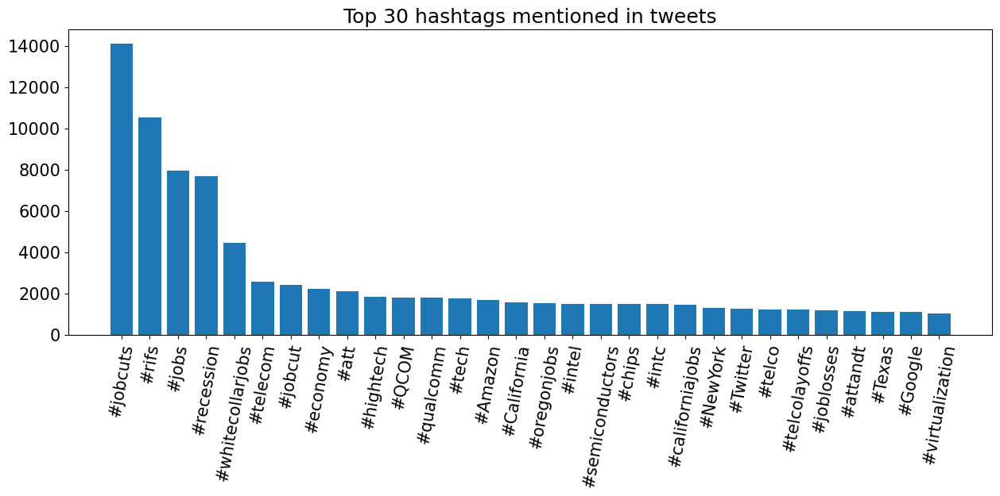

In [342]:
htgs = list(hashtags_dict.keys())[:30]
htg_freqs = list(hashtags_dict.values())[:30]


plt.figure(figsize=(15,5))
plt.rcParams.update({'font.size': 15})
plt.title("Top 30 hashtags mentioned in tweets")
plt.bar(range(len(htgs)), htg_freqs, tick_label=htgs)
plt.xticks(rotation=80)
plt.show()

### Analysis of unigrams (without hastags)


In [343]:
df_cleaned = df.copy()

def clean_text1(text):
    text = clean(text, no_urls = True ,no_emoji=True, no_emails = True, lower = False, no_currency_symbols=True, no_phone_numbers=True, replace_with_url="", replace_with_currency_symbol="", replace_with_email="", replace_with_phone_number="")
    return text


df_cleaned['Tweet']=df_cleaned['Tweet'].apply(str)

df_cleaned['Tweet']=df_cleaned['Tweet'].apply(lambda z: remove_html(z))
df_cleaned['Tweet']=df_cleaned['Tweet'].apply(lambda z: remove_hashtags(z))
df_cleaned['Tweet']=df_cleaned['Tweet'].apply(lambda z: clean_text1(z))

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\ '
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\ '
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\_'
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\G'
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")


In [344]:
# # s = "#Layoff Now paying those #bills IS the thing BUT not the end of the journey. Getting #viable job(s) is step one. If for some reason locked out of lifelong employment path working in another direction with #learning be it 4/2/year; technical; gopher or jourrneyman is imperative"
# s = df_cleaned["Tweet"][36]
# print(s)
# print("\n")
# # s.split(" ")

# sw = s.split(" ")
# print(sw)

# reqw = []
    
# # for i in range(len(sw)-1, -1, -1):
# n = len(sw)
# si = 0
# ei = 0
# pi = 0
# tempc = 0
# maxc = 0
# for i in range(n):
    
#     if sw[i].startswith("#") or sw[i].startswith("$") or s in ("", " "):
#         tempc += 1
            
#         if tempc > maxc:
#             maxc = tempc
            
#     else:
#         if tempc == maxc:
#             ei = i
#         tempc = 0
        
# if tempc == maxc:
#     ei = n-1
    
# print("---------------")
# print(ei, sw[ei])
# print(maxc)
# print(ei - maxc, sw[ei - maxc])
# print("---------------")

# for i in range(ei - maxc):
#     reqw.append(sw[i])
# print(reqw)

In [345]:
df_cleaned['Tweet'] = df_cleaned['Tweet'].apply(lambda z: remove_punctuations(z))

In [346]:
# from nltk.corpus import stopwords
# from nltk.tokenize import word_tokenize

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

# A function to remove stopwords from a text
def remove_stopwords(df, column):
    stop_words = set(stopwords.words("english"))
    stop_words.add("see")
    
    def remove_stopwords_from_text(text):
        word_tokens = word_tokenize(text)
        filtered_tokens = [token for token in word_tokens if not token.lower() in stop_words]
        return " ".join(filtered_tokens)
    
    df[column] = df[column].apply(remove_stopwords_from_text)
    return df

df_cleaned = remove_stopwords(df_cleaned, "Tweet")

In [347]:
cleaned_texts = list(df_cleaned["Tweet"])

cleaned_texts_lower = cleaned_texts.copy()
for i in range(len(cleaned_texts_lower)):
    cleaned_texts_lower[i] = cleaned_texts_lower[i].lower()

In [348]:
def get_freq_words(cleaned_texts):
    tot_text = ""
    for t in cleaned_texts:
        tot_text += t
    
    tot_words = tot_text.split(" ")
    
    word_dict = {}
    for w in tot_words:
        if w not in word_dict:
            word_dict[w] = 1

        else:
            word_dict[w] += 1
            
    word_dict = {k: v for k, v in sorted(word_dict.items(), key=lambda item: item[1], reverse = True)}

    return word_dict


word_freq_dict = get_freq_words(cleaned_texts_lower)

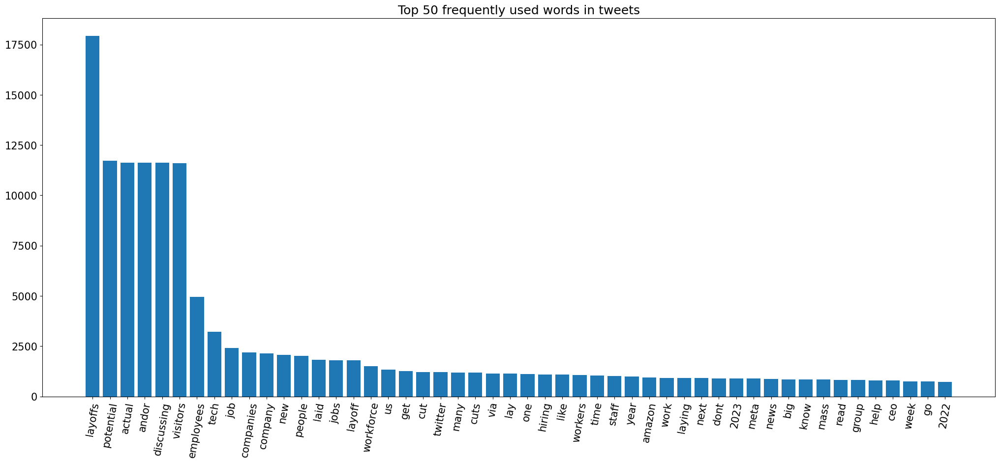

In [349]:
words = list(word_freq_dict.keys())[:50]
word_freqs = list(word_freq_dict.values())[:50]

plt.figure(figsize=(25,10))
plt.rcParams.update({'font.size': 15})
plt.title("Top 50 frequently used words in tweets")
plt.bar(range(len(words)), word_freqs, tick_label=words)
plt.xticks(rotation=80)
plt.show()

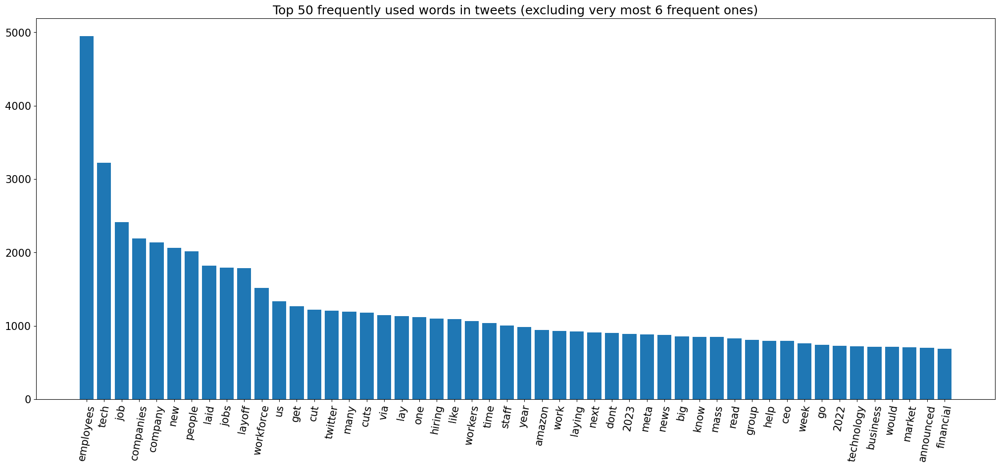

In [350]:
words = list(word_freq_dict.keys())[6:56]
word_freqs = list(word_freq_dict.values())[6:56]

plt.figure(figsize=(25,10))
plt.rcParams.update({'font.size': 15})
plt.title("Top 50 frequently used words in tweets (excluding very most 6 frequent ones)")
plt.bar(range(len(words)), word_freqs, tick_label=words)
plt.xticks(rotation=80)
plt.show()

We could see that words like "twitter" ,"meta", "amazon" freqently mentioned in the tweets, this is probably due to the fact that these top tech companies laid off a lot of a huge no.of employees, which made into the news in the period of mass layoffs.

In [351]:
df1 = df.copy()

df1["Tweet"] = df1["Tweet"].astype(str)

import pandas as pd

# Read the data into a pandas dataframe
# Select the column of LinkedIn posts
posts = df1['Tweet']

# Get the number of non-missing values
num_posts = posts.count()

# Get the mean length of the posts
mean_post_length = posts.str.len().mean()

# Get the median length of the posts
median_post_length = posts.str.len().median()

# Get the standard deviation of the post lengths
stddev_post_length = posts.str.len().std()

# Get the minimum length of the posts
min_post_length = posts.str.len().min()

# Get the maximum length of the posts
max_post_length = posts.str.len().max()

# Calculate the mean number of words in the tweets
mean_num_words = posts.str.split().str.len().mean()
median_num_words = posts.str.split().str.len().median()
stddev_num_words = posts.str.split().str.len().std()


# Print the descriptive statistics
print("Some Descriptive Stats about Tweets:- \n")
print("Number of tweets: ", num_posts)
print("Mean no.of characters of tweets: ", mean_post_length)
print("Median no.of characters of tweets: ", median_post_length)
print("Standard deviation of tweets lengths: ", stddev_post_length)
print("Minimum length of tweets: ", min_post_length)
print("Maximum length of tweets: ", max_post_length)
print()
print("Mean number of words in tweets:", int(mean_num_words))
print("Median no.of of words in tweets:", int(median_num_words))
print("Standard deviation of words in tweets:", int(stddev_num_words))
print()

Some Descriptive Stats about Tweets:- 

Number of tweets:  55404
Mean no.of characters of tweets:  207.97884629268646
Median no.of characters of tweets:  217.0
Standard deviation of tweets lengths:  59.41788007074791
Minimum length of tweets:  1
Maximum length of tweets:  346

Mean number of words in tweets: 26
Median no.of of words in tweets: 27
Standard deviation of words in tweets: 8



/var/folders/3q/txm7h4896k7f8pcsm9l619lh0000gn/T/ipykernel_25954/801810129.py:18: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pl, kde=False, bins=40)
/var/folders/3q/txm7h4896k7f8pcsm9l619lh0000gn/T/ipykernel_25954/801810129.py:24: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_p2, kde=Fa

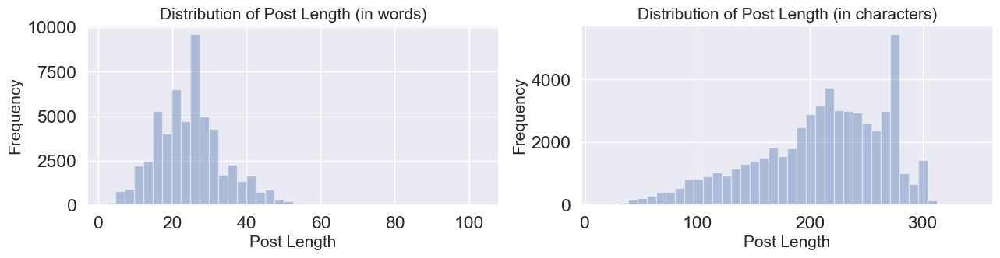

In [572]:
df_pl = df1['Tweet'].apply(lambda x: len(x.split(" ")))
df_p2 = df1['Tweet'].apply(lambda x: len(x))

# font = {'family': 'serif',
#         'color':  'darkred',
#         'weight': 'normal',
#         'size': 16,
#         }
sns.set_style("white")
font = {
        'size': 15,
        }
sns.set(font_scale=1.5)

plt.figure(figsize = (15,3))

plt.subplot(1,2,1)
sns.distplot(df_pl, kde=False, bins=40)
plt.xlabel("Post Length", fontdict=font)
plt.ylabel("Frequency", fontdict=font)
plt.title("Distribution of Post Length (in words)", fontdict=font)

plt.subplot(1,2,2)
sns.distplot(df_p2, kde=False, bins=40)
plt.xlabel("Post Length", fontdict=font)
plt.ylabel("Frequency", fontdict=font)
plt.title("Distribution of Post Length (in characters)", fontdict=font)


plt.show()

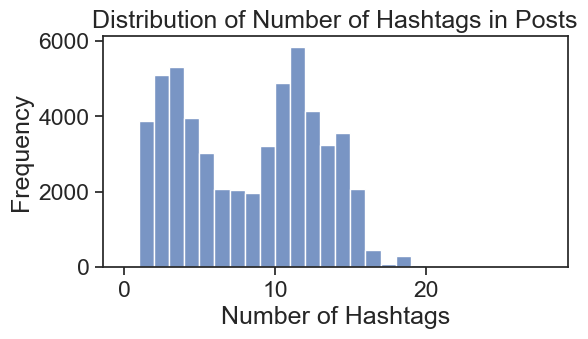

In [567]:
df_hash = df["Tweet"].apply(lambda x: str(x).count("#"))
sns.set_style("ticks")

plt.figure(figsize = (6,3))
sns.histplot(df_hash, kde=False, bins=max(df_hash))
plt.title("Distribution of Number of Hashtags in Posts")
plt.xlabel("Number of Hashtags")
plt.ylabel("Frequency")
plt.show()

# **Chronological analysis of tweets**
## Analysis of tweets based on time

In [354]:
df1 = df.copy()

df1 = df1[df1["Date"].isna() == False]
df1.reset_index(inplace=True)

In [355]:
del df1["index"]

## Timestamps at which most tweets are being posted in a day

### Hour-wise analysis

In [356]:
def get_time_posted(date):
    date = date.split(" ")
    if len(date) < 2:
        return None
    time = date[1]
    return time

df1["time"] = df1["Date"].apply(lambda z:get_time_posted(z))

In [357]:
def get_date_posted(date):
    date = date.split(" ")
    if len(date) < 2:
        return None
    time = date[0]
    return time

df1["date_p"] = df1["Date"].apply(lambda z:get_date_posted(z))

In [358]:
df1 = df1[df1["date_p"].isna() == False]
df1['time'] = pd.to_datetime(df1['time'])
df1["hour"] = df1["time"].apply(lambda z:z.hour)

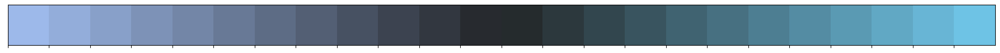

In [359]:
custom_cmap = sns.diverging_palette(h_pos= 225, h_neg = 250, s = 70 , l=75,n = 24, sep = 2 ,center="dark")
sns.palplot(custom_cmap)
plt.show()

/var/folders/3q/txm7h4896k7f8pcsm9l619lh0000gn/T/ipykernel_25954/433567380.py:12: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df1["hour"], color='#0f9c60', shade=True, linewidth=1.5, ec='black',alpha=0.75, zorder=2, legend=False)


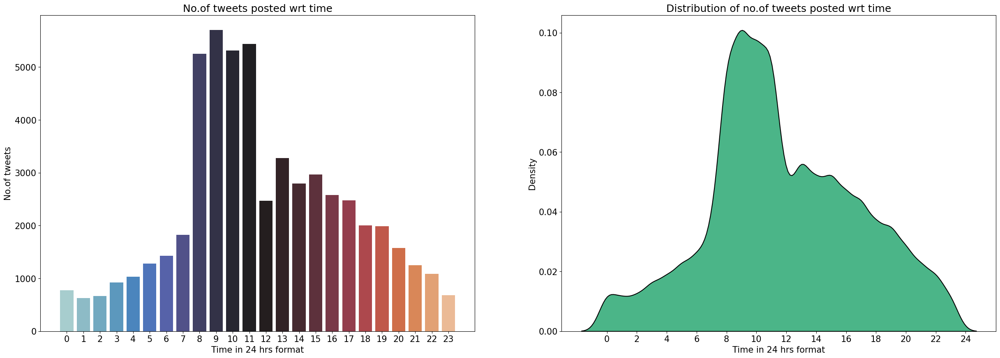

In [360]:
plt.figure(figsize = (30, 10))
# sns.countplot(df["hour"], palette=custom_cmap)
plt.subplot(1,2,1)
sns.countplot(x = df1["hour"], palette=sns.color_palette("icefire", 24))
plt.xlabel("Time in 24 hrs format")
plt.ylabel("No.of tweets")
plt.title("No.of tweets posted wrt time")
plt.plot()


plt.subplot(1,2,2)
sns.kdeplot(df1["hour"], color='#0f9c60', shade=True, linewidth=1.5, ec='black',alpha=0.75, zorder=2, legend=False)
plt.xlabel("Time in 24 hrs format")
plt.title("Distribution of no.of tweets posted wrt time")
time_axis = [2*i for i in range(13)]
plt.xticks(time_axis)

plt.plot()

plt.show()

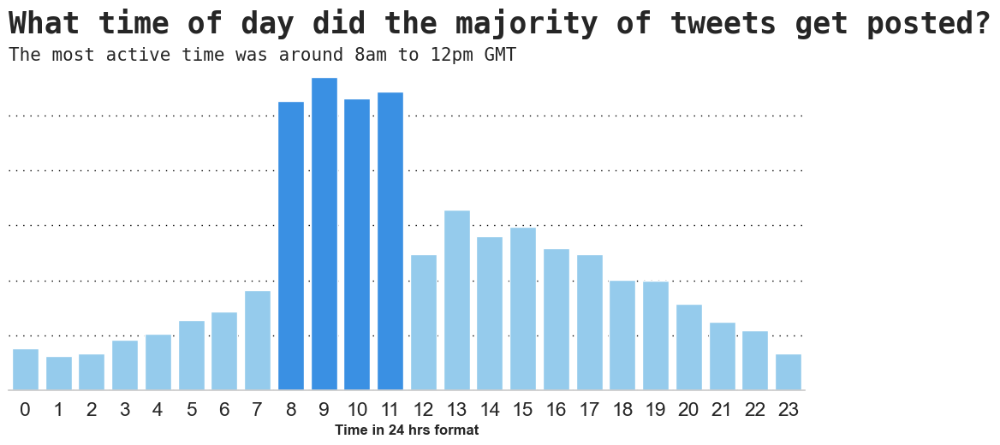

In [588]:
fig=plt.figure(figsize=(12,5),facecolor='white')
gs=fig.add_gridspec(1,1)

ax=[None]
ax[0]=fig.add_subplot(gs[0,0])

ax[0].text(-0.5, 6500, 
         'What time of day did the majority of tweets get posted?', 
         fontsize=25, 
         fontweight='bold', 
         fontfamily='monospace'
        )

ax[0].text(-0.5, 6000, 
         'The most active time was around 8am to 12pm GMT', 
         fontsize=15, 
         fontweight='light', 
         fontfamily='monospace'
        )

ax[0].grid(color='black', linestyle=':', axis='y', zorder=0,  dashes=(1,5))


# colormap = ["wheat" for _ in range(24)]
# colormap[8] = "gold"
# colormap[9] = "gold"
# colormap[10] = "gold"
# colormap[11] = "gold"

colormap = ["lightskyblue" for _ in range(24)]
colormap[8] = "dodgerblue"
colormap[9] = "dodgerblue"
colormap[10] = "dodgerblue"
colormap[11] = "dodgerblue"

sns.countplot(x = df1["hour"], palette=colormap,alpha=1,zorder=2)


for direction in ['top','right','left']:
    ax[0].spines[direction].set_visible(False)
    
    
ax[0].set_xlabel("Time in 24 hrs format", fontsize=12, fontweight='bold')

# plt.ylabel("No.of tweets")
# plt.title("No.of tweets posted wrt time")
# plt.plot()
ax[0].set_yticklabels([])
ax[0].tick_params(axis='y',length=0)
ax[0].set_ylabel('',)
plt.show()

### Observation:-

**We could see that a lot of the tweets are posted in between 8am to 12pm, which genreally is the starting time of many workplaces all around the world, and as expected, the activity is low as it becomes night.**

### Weekly distribution of tweets about layoffs (from the starting day)

In [361]:
def get_num_tweets(df, df_name):
    
    op_dict = {}
    
    sm = 9
    em = 10
    curr_year = 2022
    
    sy = curr_year
    ey = curr_year
    for i in range(4):
        
        if em > 12:
            em = 1
            ey += 1
            
        if sm > 12:
            sm = 1
            sy += 1
        
        if sm < 10:
            sd = str(sy)+"-0" + str(sm) + "-01"
        else:
            sd = str(sy)+"-"+str(sm)+"-" + "01"
            
        if em < 10:
            ed = str(ey)+"-0" + str(em) + "-01"
        else:
            ed = str(ey)+"-"+str(em)+"-" + "01"
            
        sm += 1
        em += 1
    
        query = '''SELECT COUNT(*) AS num_tweets FROM {} WHERE Date BETWEEN '{}' AND '{}' ''';
        query_f = query.format(df_name, sd, ed)
        op_df = duckdb.query(query_f).to_df()
        
        print(op_df)
#         op_df = sqldf(q)        
        key = query_f.split("BETWEEN ")[1]
        op_dict[key] = int(op_df["num_tweets"])
        
    return op_dict

In [362]:
mw_tweet_dict = get_num_tweets(df1, "df1")
mw_tweet_dict

   num_tweets
0        1701
   num_tweets
0        6041
   num_tweets
0       13007
   num_tweets
0       15578


{"'2022-09-01' AND '2022-10-01' ": 1701,
 "'2022-10-01' AND '2022-11-01' ": 6041,
 "'2022-11-01' AND '2022-12-01' ": 13007,
 "'2022-12-01' AND '2023-01-01' ": 15578}

In [363]:
def get_num_tweets(df, df_name):
    
    op_dict = {}
    
    sm = 9
    em = 10
    curr_year = 2022
    
    sy = curr_year
    ey = curr_year
    for i in range(4):
        
        if em > 12:
            em = 1
            ey += 1
            
        if sm > 12:
            sm = 1
            sy += 1
        
        if sm < 10:
            sd = str(sy)+"-0" + str(sm) + "-01"
        else:
            sd = str(sy)+"-"+str(sm)+"-" + "01"
            
        if em < 10:
            ed = str(ey)+"-0" + str(em) + "-01"
        else:
            ed = str(ey)+"-"+str(em)+"-" + "01"
            
        sm += 1
        em += 1
    
        query = '''SELECT COUNT(*) AS num_tweets FROM {} WHERE Date BETWEEN '{}' AND '{}';''';
        query_f = query.format(df_name, sd, ed)
        op_df = duckdb.query(query_f).to_df()

        key = query_f.split("BETWEEN ")[1]
        op_dict[key] = int(op_df["num_tweets"])
        
    return op_dict

In [364]:
def get_week_wise_tcount(df, month, year, df_name):
    
    op_dict = {}
    curr_year = year
    
    st_day = 1
    end_day = 7
    for i in range(4):
        
        if i == 3:
            end_day = 31
            if month < 10:
            
                if st_day < 10:
                    sd = str(year)+ "-0" + str(month) + "-0" + str(st_day)

                else:
                    sd = str(year)+ "-0" +str(month) + "-" + str(st_day)


                if end_day < 10:
                    ed = str(year)+ "-0" + str(month) + "-0" + str(end_day)

                else:
                    ed = str(year)+ "-0" +str(month) + "-" + str(end_day)

                
            else:

                if st_day < 10:
                    sd = str(year)+"-" + str(month) + "-0" + str(st_day)

                else:
                    sd = str(year)+"-" + str(month)+"-" + str(st_day)


                if end_day < 10:
                    ed = str(year)+ "-" + str(month) + "-0" + str(end_day)

                else:
                    ed = str(year)+ "-" +str(month)+"-" + str(end_day)
                    
            
            query = '''SELECT COUNT(*) AS num_tweets FROM {} WHERE Date BETWEEN '{}' AND '{}';''';
            query_f = query.format(df_name, sd, ed)
            op_df = duckdb.query(query_f).to_df()


            key = query_f.split("BETWEEN ")[1]
            op_dict[key] = int(op_df["num_tweets"])
            
            return op_dict

        
        if month < 10:
            
            if st_day < 10:
                sd = str(year)+ "-0" + str(month) + "-0" + str(st_day)
                
            else:
                sd = str(year)+ "-0" +str(month) + "-" + str(st_day)
                
            
            if end_day < 10:
                ed = str(year)+ "-0" + str(month) + "-0" + str(end_day)
                
            else:
                ed = str(year)+ "-0" +str(month) + "-" + str(end_day)
            
                
        else:
            
            if st_day < 10:
                sd = str(year)+"-" + str(month) + "-0" + str(st_day)
                
            else:
                sd = str(year)+"-" + str(month)+"-" + str(st_day)
            
            
            if end_day < 10:
                ed = str(year)+ "-" + str(month) + "-0" + str(end_day)
                
            else:
                ed = str(year)+ "-" +str(month)+"-" + str(end_day)
            
            
                    
        query = '''SELECT COUNT(*) AS num_tweets FROM {} WHERE Date BETWEEN '{}' AND '{}';''';
        query_f = query.format(df_name, sd, ed)
        op_df = duckdb.query(query_f).to_df()
#   
        key = query_f.split("BETWEEN ")[1]
        op_dict[key] = int(op_df["num_tweets"])
        
        
        st_day = end_day + 1
        end_day += 7
        
        

In [365]:
get_week_wise_tcount(df1, 10, 2022, "df1")

{"'2022-10-01' AND '2022-10-07';": 561,
 "'2022-10-08' AND '2022-10-14';": 1098,
 "'2022-10-15' AND '2022-10-21';": 1362,
 "'2022-10-22' AND '2022-10-31';": 2019}

In [366]:
def get_monthly_week_tc(df, year, sm, em, df_name):
    
    op_dict = {}
    
    for m in range(sm,em+1):
        
        op_dict[m] = get_week_wise_tcount(df, m, year,df_name)
    return op_dict

In [367]:
mw_2022_dict = get_monthly_week_tc(df1, 2022, 9, 12, "df1")
mw_2022_dict

{9: {"'2022-09-01' AND '2022-09-07';": 231,
  "'2022-09-08' AND '2022-09-14';": 240,
  "'2022-09-15' AND '2022-09-21';": 367,
  "'2022-09-22' AND '2022-09-31';": 647},
 10: {"'2022-10-01' AND '2022-10-07';": 561,
  "'2022-10-08' AND '2022-10-14';": 1098,
  "'2022-10-15' AND '2022-10-21';": 1362,
  "'2022-10-22' AND '2022-10-31';": 2019},
 11: {"'2022-11-01' AND '2022-11-07';": 2287,
  "'2022-11-08' AND '2022-11-14';": 3563,
  "'2022-11-15' AND '2022-11-21';": 2718,
  "'2022-11-22' AND '2022-11-31';": 2789},
 12: {"'2022-12-01' AND '2022-12-07';": 2106,
  "'2022-12-08' AND '2022-12-14';": 3482,
  "'2022-12-15' AND '2022-12-21';": 3575,
  "'2022-12-22' AND '2022-12-31';": 3555}}

In [368]:
mw_2023_dict = get_monthly_week_tc(df1, 2023, 1, 2, "df1")
mw_2023_dict

{1: {"'2023-01-01' AND '2023-01-07';": 2491,
  "'2023-01-08' AND '2023-01-14';": 2870,
  "'2023-01-15' AND '2023-01-21';": 6978,
  "'2023-01-22' AND '2023-01-31';": 5208},
 2: {"'2023-02-01' AND '2023-02-07';": 0,
  "'2023-02-08' AND '2023-02-14';": 0,
  "'2023-02-15' AND '2023-02-21';": 0,
  "'2023-02-22' AND '2023-02-31';": 0}}

In [369]:
df1["Date"] = pd.to_datetime(df1['Date'])
df1_copy = df1.copy()

df1_copy.index = df1_copy['Date']

## Calender plots (Heatmaps) of the data acquired 

In [370]:
import calplot

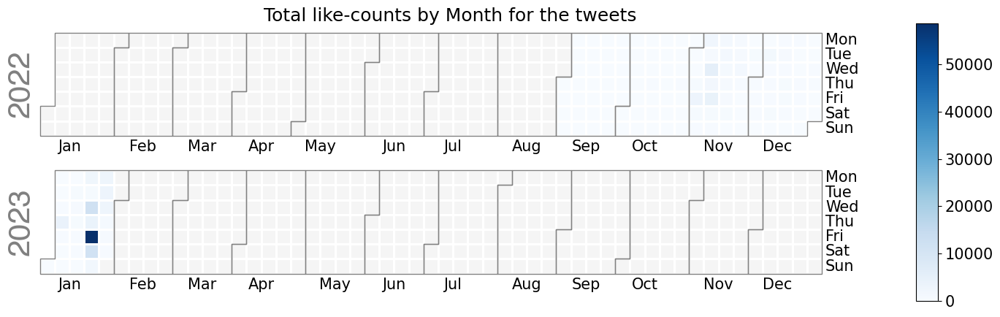

In [371]:
pl1 = calplot.calplot(data = df1_copy['likeCount'],how = 'sum', cmap = 'Blues', figsize = (15, 4), suptitle = "Total like-counts by Month for the tweets")



In [372]:
query = '''
SELECT date_p, COUNT(*) AS num_tweets FROM df1 GROUP BY date_p ORDER BY date_p ASC;
'''

num_tweets_pd_df = duckdb.query(query).to_df()

In [373]:
num_tweets_pd_df["date_p"] = pd.to_datetime(num_tweets_pd_df['date_p'])
num_tweets_pd_df.index = num_tweets_pd_df['date_p']

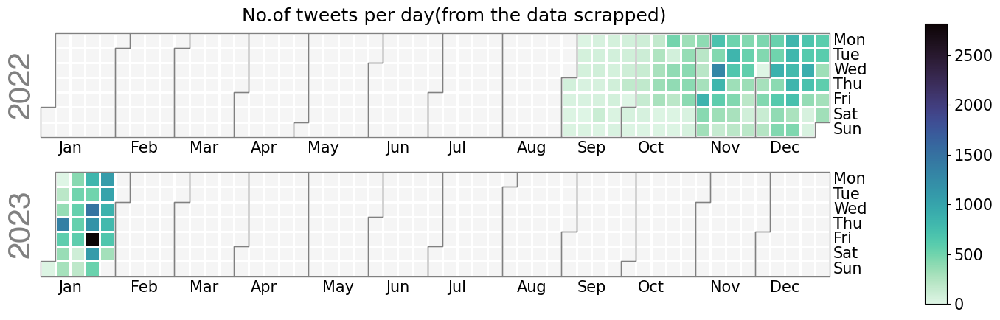

In [374]:
pl2 = calplot.calplot(data = num_tweets_pd_df['num_tweets'],how = 'sum', cmap = 'mako_r', figsize = (15, 4), suptitle = "No.of tweets per day(from the data scrapped)")


In [717]:
recession_tweets_df = pd.read_csv("recession_tweets.csv")

/var/folders/3q/txm7h4896k7f8pcsm9l619lh0000gn/T/ipykernel_25954/2931761101.py:1: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  recession_tweets_df = pd.read_csv("recession_tweets.csv")


In [377]:
def get_num_tweets_hist(df):
    
    comp_hist = {}

    temp_df = pd.DataFrame(df['Date'].dt.date)
    temp_df.index = [i for i in range(len(temp_df))]
    
    q = '''
        SELECT DISTINCT(Date) AS date FROM temp_df
    '''
    all_dates_df = duckdb.query(q).to_df()
    
    
    temp = df.groupby("date_p")
    tempc = temp.count()
    
    numt_arr = [0]*len(all_dates_df)
        
    for i in range(len(all_dates_df)):
        curr_date = all_dates_df.iloc[i]["date"]
        if str(curr_date.date()) in tempc.index:
            numt_arr[i] = tempc.loc[str(curr_date.date())]["Tweet"]
        
        
        
    return numt_arr

In [378]:
num_tweets_layoffs = get_num_tweets_hist(df1_copy)

In [379]:
len(num_tweets_layoffs)

147

In [762]:
df1_copy

,Date,User,Tweet,likeCount,replyCount,retweetCount,retweetedTweet,location,time,date_p,...,Twitter,Google,Microsoft,Oracle,Cisco,Goldman Sachs,Salesforce,HP,Walmart,Coinbase
Date,,,,,,,,,,,,,,,,,,,,,
2022-09-01 00:23:40,2022-09-01 00:23:40,DigitalAssetsUS,Do a search for “#layoffs “ under news topics....,1.0,0.0,0.0,NaN,Saltwater Gospel 🌞,2023-02-14 00:23:40,2022-09-01,...,0,0,0,0,0,0,0,0,0,0
2022-09-01 00:38:10,2022-09-01 00:38:10,hussaini_mshehu,How do you have massive #layoffs and still hav...,1.0,0.0,0.0,NaN,NaN,2023-02-14 00:38:10,2022-09-01,...,0,0,0,0,0,0,0,0,0,0
2022-09-01 01:24:24,2022-09-01 01:24:24,calcorphousing,Are the recent layoffs the result of overhirin...,0.0,0.0,0.0,NaN,United States,2023-02-14 01:24:24,2022-09-01,...,0,0,0,0,0,0,0,0,0,0
2022-09-01 01:28:55,2022-09-01 01:28:55,KimberleeAnny,"To my @Snapchat family, if there is anyway I c...",2.0,3.0,0.0,NaN,Los Angeles,2023-02-14 01:28:55,2022-09-01,...,0,0,0,0,0,0,0,0,0,0
2022-09-01 01:59:34,2022-09-01 01:59:34,judeyblu,Did you know that over 10% of all #layoffs fo...,0.0,0.0,0.0,NaN,"Ann Arbor, MI",2023-02-14 01:59:34,2022-09-01,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-28 22:26:18,2023-01-28 22:26:18,zhulia2023,With the amount of layoffs that’s happening ri...,0.0,0.0,0.0,NaN,纯正的西海岸,2023-02-14 22:26:18,2023-01-28,...,0,0,0,0,0,0,0,0,0,0
2023-01-28 22:30:00,2023-01-28 22:30:00,TheQuint,"With #layoffs constantly making headlines, a s...",0.0,0.0,0.0,NaN,NaN,2023-02-14 22:30:00,2023-01-28,...,0,0,0,0,0,0,0,0,0,0
2023-01-28 22:30:21,2023-01-28 22:30:21,abarnea1,‘Don’t be evil?’ Lol.\nWhy does pressure from ...,2.0,0.0,0.0,NaN,"Montréal, QC, Canada",2023-02-14 22:30:21,2023-01-28,...,0,1,0,0,0,0,0,0,0,0


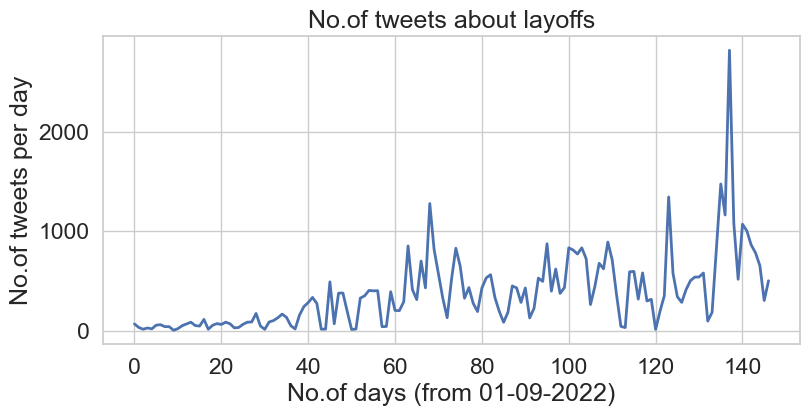

In [716]:
plt.figure(figsize=(9,4))
plt.plot(num_tweets_layoffs , linewidth = 2)
plt.title("No.of tweets about layoffs")
plt.xlabel("No.of days (from 01-09-2022)")
plt.ylabel("No.of tweets per day")
plt.show()

In [719]:
del recession_tweets_df["Unnamed: 0"]

In [721]:
rec_df = recession_tweets_df[recession_tweets_df["Date"].isna() == False]
rec_df.reset_index(inplace=True)

In [723]:
del rec_df["index"]

In [724]:
rec_df

,Date,User,Tweet,likeCount,replyCount,retweetCount,retweetedTweet,location
0,2023-02-14 23:52:06+00:00,Aschmidt2003,Many businesses are turning to a reduction in ...,0.0,0,0.0,NaN,"Minneapolis, MN"
1,2023-02-14 23:44:53+00:00,AinslieBullion,“No Landing” v Hard or Soft Landing – No one r...,5.0,1,2.0,NaN,Brisbane & Melbourne
2,2023-02-14 23:42:11+00:00,InvariantPersp1,#recession ... #GFC2 US #Consumer edition\n\nT...,0.0,0,0.0,NaN,NaN
3,2023-02-14 23:36:10+00:00,LoriRealtor,Are you wondering why your house hasn’t sold y...,0.0,0,0.0,NaN,"Glendora, CA"
4,2023-02-14 23:29:45+00:00,Fapplebee,Shawty I promise you that Louis Vuitton or Guc...,0.0,0,0.0,NaN,Rockport TX
...,...,...,...,...,...,...,...,...
161740,2021-09-01 00:47:45+00:00,InvariantPersp1,#recession ... #CentralBanks Pushing on a Stri...,0.0,0.0,0.0,NaN,NaN
161741,2021-09-01 00:38:39+00:00,InvariantPersp1,#recession ... #CentralBanks Pushing on a Stri...,0.0,0.0,0.0,NaN,NaN
161742,2021-09-01 00:37:01+00:00,InvariantPersp1,#recession ... #ECB Pushing on a String edition,1.0,0.0,0.0,NaN,NaN
161743,2021-09-01 00:33:56+00:00,InvariantPersp1,#recession ... #Fed/#Treasury Pushing on a Str...,0.0,0.0,0.0,NaN,NaN


In [384]:
rec_df["Date"] = pd.to_datetime(rec_df["Date"],  format='%Y-%m-%d %H:%M:%S', errors='coerce')

In [385]:
# rec_df.sort_values(by='Date', inplace=False)

In [726]:
def get_date(ts):
    return ts.split(" ")[0]

# def get_date1(ts):
#     return ts.date


In [727]:
rec_df["date_p"] = rec_df["Date"].apply(lambda z:get_date(z))

/var/folders/3q/txm7h4896k7f8pcsm9l619lh0000gn/T/ipykernel_25954/2343364761.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rec_df["date_p"] = rec_df["Date"].apply(lambda z:get_date(z))


In [730]:
rec_df["date_p"]  = pd.to_datetime(rec_df["date_p"],  errors='coerce')

/var/folders/3q/txm7h4896k7f8pcsm9l619lh0000gn/T/ipykernel_25954/661096438.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rec_df["date_p"]  = pd.to_datetime(rec_df["date_p"],  errors='coerce')


In [773]:
rec_df = rec_df[rec_df["date_p"] >= "2022-09-01"]

In [774]:
rec_df = rec_df.sort_values(by='date_p', inplace=False, ascending=True)

In [776]:
rec_df = rec_df[rec_df["date_p"].isna() == False]
rec_df.reset_index(inplace=True)

In [777]:
rec_df

,level_0,index,Date,User,Tweet,likeCount,replyCount,retweetCount,retweetedTweet,location,date_p
0,87156,74221,2022-09-01 16:24:00+00:00,EquiMaxCapital,Real #Estate #Market #Mortgage #Modification #...,0.0,0,0.0,NaN,Washington DC Metro,2022-09-01
1,87510,74555,2022-09-01 00:37:14+00:00,InvariantPersp1,#recession ... #GFC2 Taiwan #Manufacturing #PM...,3.0,1,0.0,NaN,NaN,2022-09-01
2,87509,74309,2022-09-01 13:51:02+00:00,MBjegovic,And the #Fed wants to hike in Sep?\n\n#disinfl...,3.0,0,1.0,NaN,"London, UK",2022-09-01
3,87508,74567,2022-09-01 00:03:59+00:00,InvariantPersp1,#recession ... #StockMarket #Bubble edition ht...,0.0,0,0.0,NaN,NaN,2022-09-01
4,87507,74566,2022-09-01 00:06:47+00:00,Tdubz100,The democrat hero...\n\n#Joebiden #democrats #...,0.0,0,0.0,NaN,United States,2022-09-01
...,...,...,...,...,...,...,...,...,...,...,...
74561,161516,2,2023-02-14 23:42:11+00:00,InvariantPersp1,#recession ... #GFC2 US #Consumer edition\n\nT...,0.0,0,0.0,NaN,NaN,2023-02-14
74562,161515,1,2023-02-14 23:44:53+00:00,AinslieBullion,“No Landing” v Hard or Soft Landing – No one r...,5.0,1,2.0,NaN,Brisbane & Melbourne,2023-02-14
74563,161514,149,2023-02-14 13:54:52+00:00,TheLayoffBot,https://t.co/cFfQNvj0ge\nIntel\nIf you're wond...,0.0,0,0.0,NaN,NaN,2023-02-14
74564,161521,7,2023-02-14 22:47:21+00:00,LonskiJohn,Recessions brought an end to each previous bou...,6.0,0,4.0,NaN,NaN,2023-02-14


In [779]:
rec_df["date_p"].unique().shape

(167,)

In [780]:
def get_num_tweets_hist_rec(rec_df):
    
    comp_hist = {}

#     temp_df = pd.DataFrame(df['date_p'].dt.date)
#     temp_df.index = [i for i in range(len(temp_df))]
    rec_df = rec_df[rec_df["date_p"] <= '2023-01-28']
    
    q = '''
        SELECT DISTINCT(date_p) AS date FROM rec_df
    '''
    all_dates_df = duckdb.query(q).to_df()
    
    print(all_dates_df.shape)
    
    temp = rec_df.groupby("date_p")
    tempc = temp.count()
    
    numt_arr = [0]*len(all_dates_df)
        
    for i in range(len(all_dates_df)):
        curr_date = all_dates_df.iloc[i]["date"]
        if str(curr_date.date()) in tempc.index:
            numt_arr[i] = tempc.loc[str(curr_date.date())]["Tweet"]
        
        
        
    return numt_arr

In [781]:
num_tweets_recession = get_num_tweets_hist_rec(rec_df)

(150, 1)


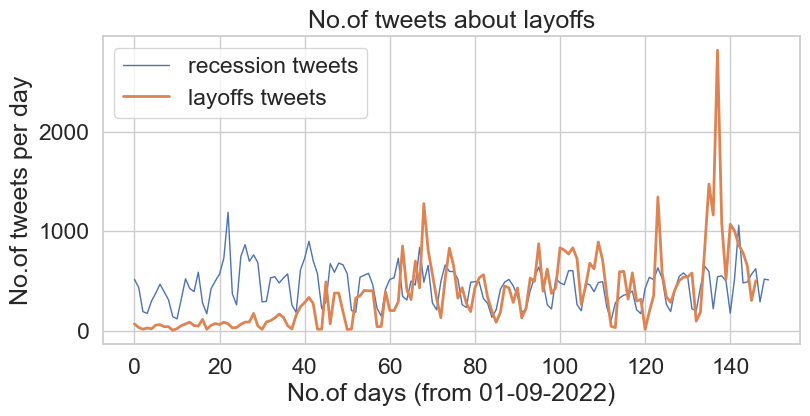

In [789]:
plt.figure(figsize=(9,4))
plt.plot(num_tweets_recession , linewidth = 1, label = "recession tweets")
plt.plot(num_tweets_layoffs , linewidth = 2, label = "layoffs tweets")
plt.title("No.of tweets about layoffs")
plt.xlabel("No.of days (from 01-09-2022)")
plt.ylabel("No.of tweets per day")
plt.legend()
plt.show()

In [784]:
# num_tweets_recession

In [392]:
# rec1 = pd.read_csv('/Users/sreevaatsav/Downloads/recession_tweets1.csv')
# rec2 = pd.read_csv('/Users/sreevaatsav/Downloads/recession_tweets2.csv')
# rec3 = pd.read_csv('/Users/sreevaatsav/Downloads/recession_tweets3.csv')
# rec4 = pd.read_csv('/Users/sreevaatsav/Downloads/recession_tweets4.csv')

In [393]:
def remove_emoji(text):
    text = clean(text,no_emoji=True, lower = False)
    return text

def get_isabout_comp(text, search_w):
    
    text = remove_hashsymbol(text)
    text = (text)
    text = remove_html(text)

    text = text.lower()
    
    for sw in search_w: 
        if sw in text:
            return True
    
    return False
    
    
def get_num_tweets_company(df, company):
    compname = company
    company = company.lower()
    
    company = company.split(" ")
    
    search_w = []
    if len(company) > 1:
        
        w1 = ""
        w2 = ""
        for w in company:
            w1 += w
            w2 += w
            w2 += " "
            
        search_w.append(w1)
        search_w.append(w2)

        
    else:
        search_w.append(company[0])
        
        
    num_tweets_comp = []
    
    for i in range(len(df)):
        if get_isabout_comp(df.iloc[i]["Tweet"], search_w):
            num_tweets_comp.append(1)
        else:
            num_tweets_comp.append(0)
            
    df1_copy[compname] = num_tweets_comp


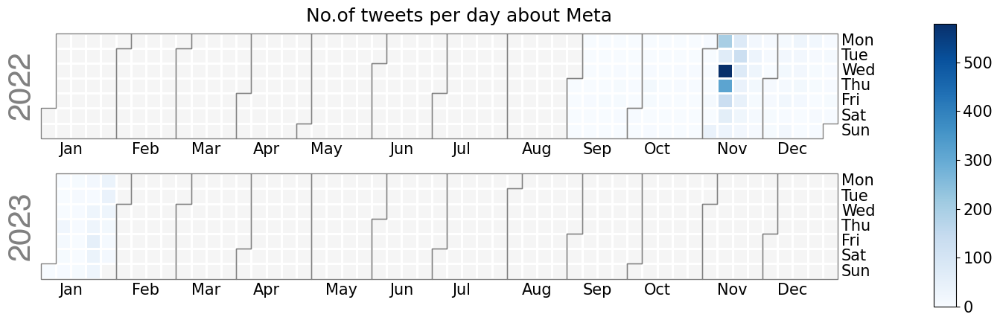

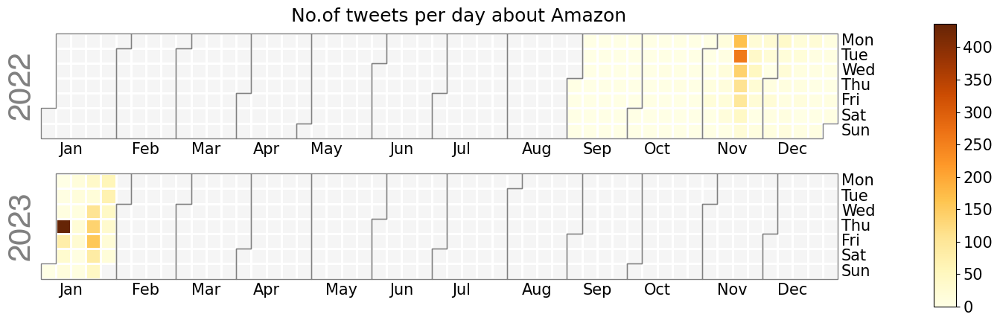

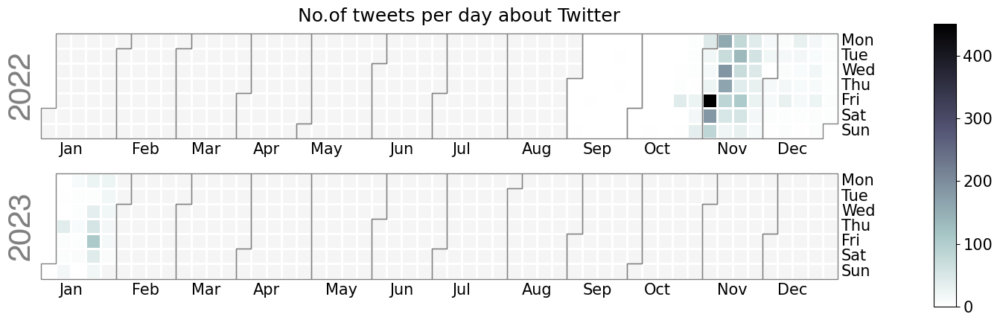

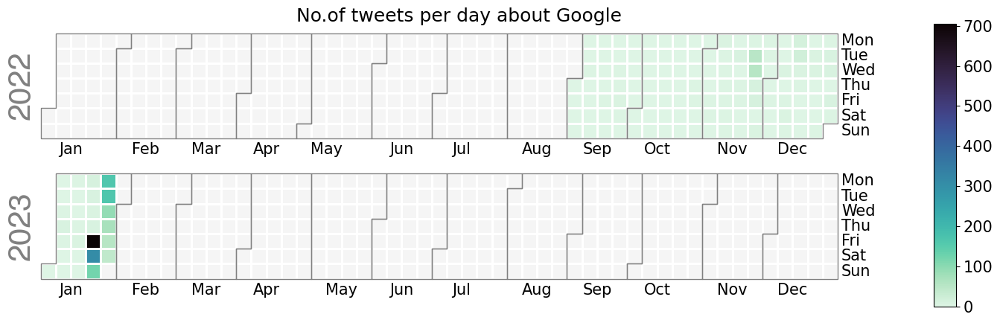

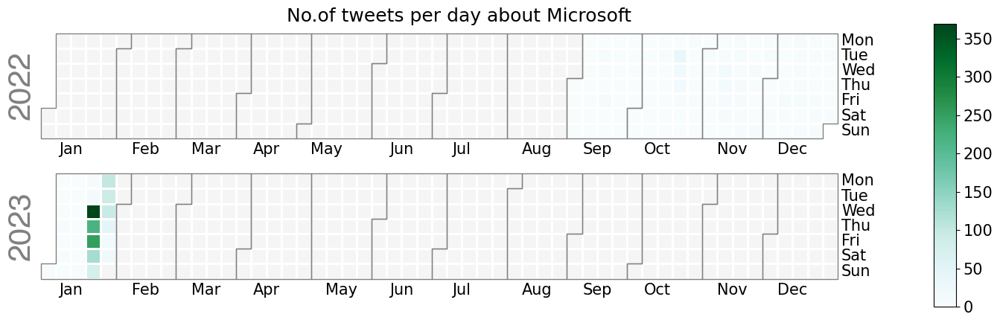

...

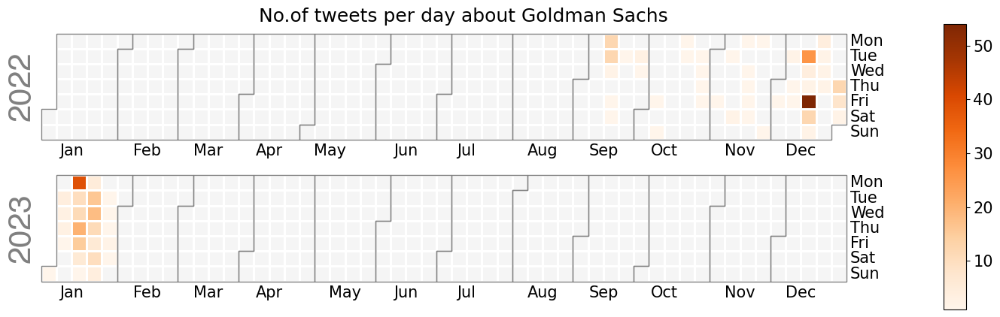

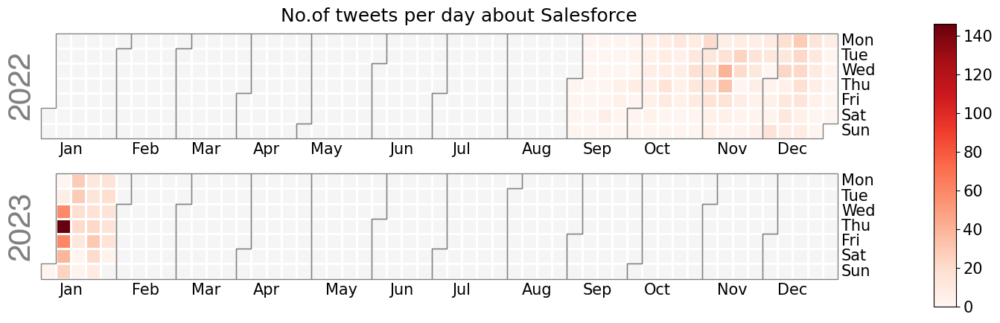

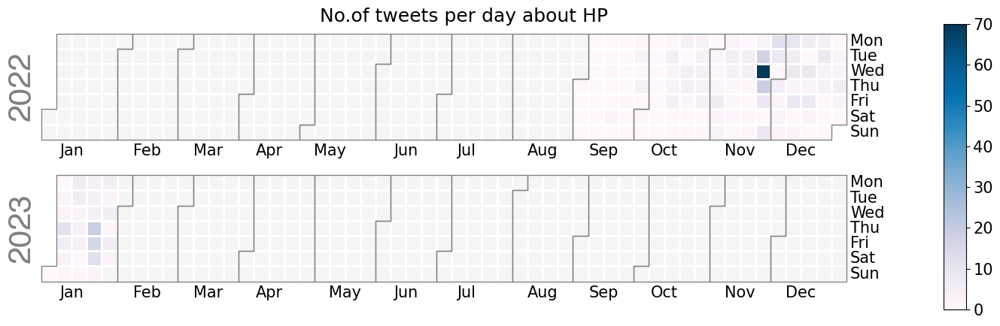

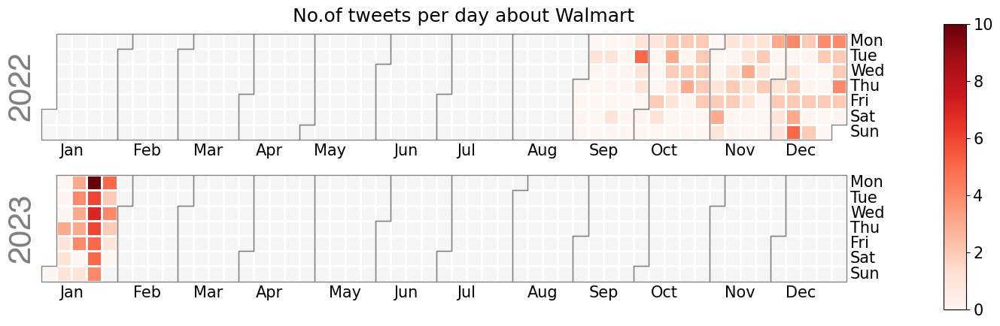

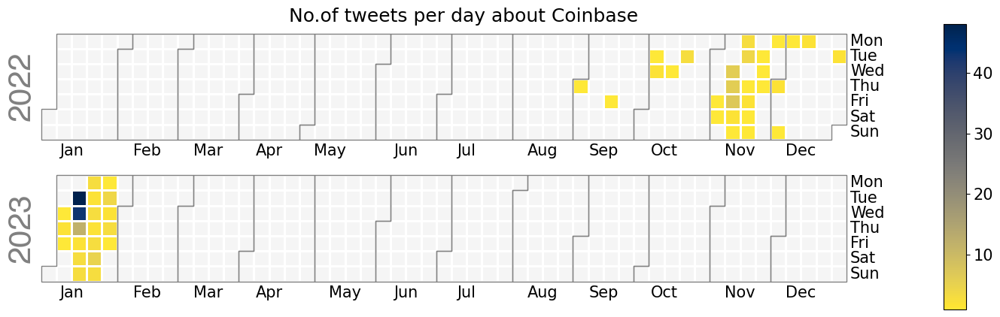

In [394]:
def comp_timelines_heatmap(df, companies, colors):
    
    i = 0
    for comp in companies:
        get_num_tweets_company(df1_copy, comp)
        pl2 = calplot.calplot(data = df1_copy[comp],how = 'sum', cmap = colors[i], figsize = (15, 4), suptitle = "No.of tweets per day" + " about "+ comp)
        i += 1


companies = ["Meta", "Amazon", "Twitter", "Google", "Microsoft", "Oracle", "Cisco", "Goldman Sachs", "Salesforce", "HP", "Walmart", "Coinbase"]
colors = ["Blues", "YlOrBr", "bone_r", "mako_r", "BuGn", "Greens", "Purples", "Oranges", "Reds", "PuBu", "Reds", "cividis_r"]
comp_timelines_heatmap(df1_copy, companies, colors)

### Observation:- 
**We could see the timelines and trends for each company from sept 2022 till the present time. This could potentially give us a visualzation of the layoff-waves, as the no.of tweets about that particular comapny would be high whenever the company fires some part of it's workforce.**

The same is done in the next part, this time woth histograms, rather than calender plots, for visualising the peaks and waves better.

## **Histograms of the no.of tweets for each company (in chronological order)**


In [395]:
df1_copy_indfix = df1_copy.copy()

In [396]:
temp = df1_copy_indfix[df1_copy_indfix["Amazon"] == 1].groupby("date_p")
tempc = temp.count()

# tempc.loc['2022-08-01']


'2022-08-01' in tempc.index

False

In [397]:
tempc["Tweet"]

date_p
2022-09-01     2
2022-09-04     1
2022-09-07     1
2022-09-09     1
2022-09-12     1
              ..
2023-01-24    69
2023-01-25    41
2023-01-26    31
2023-01-27    20
2023-01-28    17
Name: Tweet, Length: 119, dtype: int64

In [398]:
temp_df = pd.DataFrame(df1_copy_indfix['Date'].dt.date)
temp_df.index = [i for i in range(len(temp_df))]
    
q = '''
        SELECT DISTINCT(Date) AS date FROM temp_df
    '''
all_dates_df = duckdb.query(q).to_df()

# all_dates_df

In [399]:
df1_copy_indfix.index = [i for i in range(len(df1_copy_indfix))]

In [400]:
def get_num_tweets_hist_comp(df1_copy_indfix, companies):
    
    comp_hist = {}

    temp_df = pd.DataFrame(df1_copy_indfix['Date'].dt.date)
    temp_df.index = [i for i in range(len(temp_df))]
    
    q = '''
        SELECT DISTINCT(Date) AS date FROM temp_df
    '''
    all_dates_df = duckdb.query(q).to_df()
    
    for cname in companies:
        
        temp = df1_copy_indfix[df1_copy_indfix[cname] == 1].groupby("date_p")
        tempc = temp.count()
    
        comp_arr = [0]*len(all_dates_df)
        
        for i in range(len(all_dates_df)):
            curr_date = all_dates_df.iloc[i]["date"]
            if str(curr_date.date()) in tempc.index:
                comp_arr[i] = tempc.loc[str(curr_date.date())]["Tweet"]
        
        comp_hist[cname] = comp_arr
        
    return comp_hist


In [401]:
companies = ["Meta", "Amazon", "Twitter", "Google", "Microsoft", "Oracle", "Cisco", "Goldman Sachs", "Salesforce", "HP", "Walmart", "Coinbase"]

comp_hist_dict = get_num_tweets_hist_comp(df1_copy_indfix, companies)

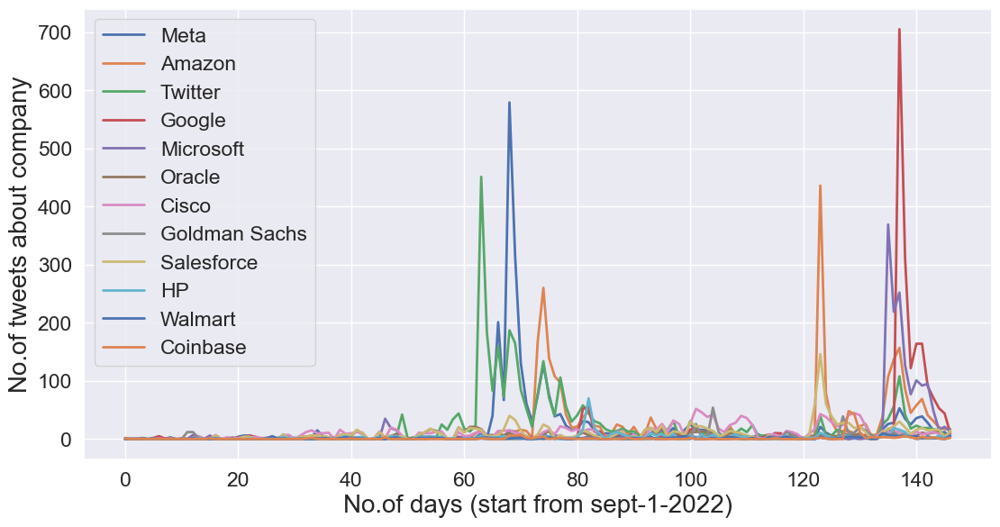

In [574]:
plt.figure(figsize=(13,6.5))

for k in comp_hist_dict.keys():
    
    plt.plot(comp_hist_dict[k], label= k, linewidth = 2)
    
    
plt.legend(loc='best')
plt.xlabel("No.of days (start from sept-1-2022)", fontsize = 20)
plt.ylabel("No.of tweets about company", fontsize = 20)
plt.show()

In [403]:
from scipy.ndimage.filters import gaussian_filter

def moving_average(data, num_steps):
    moving_average = []
    for i in range(len(data)):
        if i + num_steps < len(data):
            moving_average.append(np.mean(data[i:i+num_steps]))
        else:
            moving_average.append(np.mean(data[i:len(data)]))
    return moving_average



def get_smoothen_curve(company, comp_hist_dict, sigma_y = 1.25):
    y = comp_hist_dict[company]
    x = [i for i in range(len(y))]
    
    y_smooth = gaussian_filter(y, sigma=sigma_y)
    
    return y_smooth

def triangular_moving_average(data, window_size):
    window = np.arange(1, window_size + 1)
    window = window / window.sum()
    return np.convolve(data, window, 'same')

def parabolic_moving_average(data, window_size):
    window = np.arange(1, window_size + 1)
    window = window**2
    window = window / window.sum()
    return np.convolve(data, window, 'same')

/var/folders/3q/txm7h4896k7f8pcsm9l619lh0000gn/T/ipykernel_25954/2831465802.py:1: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter


In [404]:
def custom_mv_avg(comp_hist_dict, th = 7, ratio = 0.2):
    
    mov_avg_dict_comp = {}

    for k in comp_hist_dict.keys():

        mov_avg = moving_average(comp_hist_dict[k], num_steps=th)
        mov_avg1 = triangular_moving_average(comp_hist_dict[k],window_size=th)
        
        favg = (1-ratio)*np.array(mov_avg)+ ratio*np.array(mov_avg1)
        
        mov_avg_dict_comp[k] = favg
        
    return mov_avg_dict_comp

mov_avg_dict_comp = custom_mv_avg(comp_hist_dict,th=4)

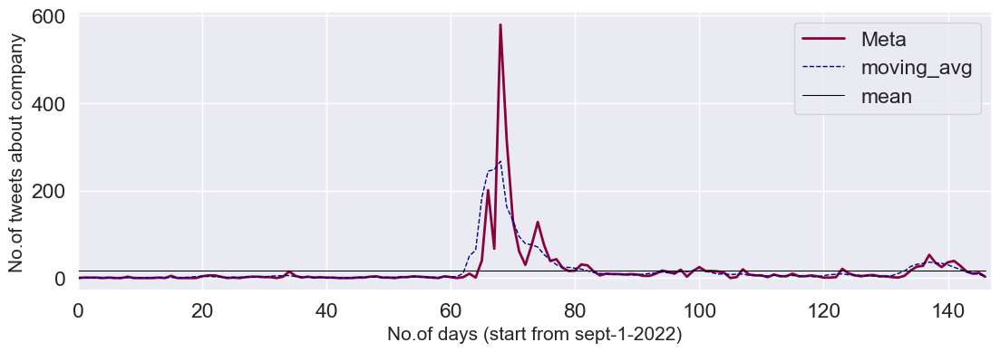

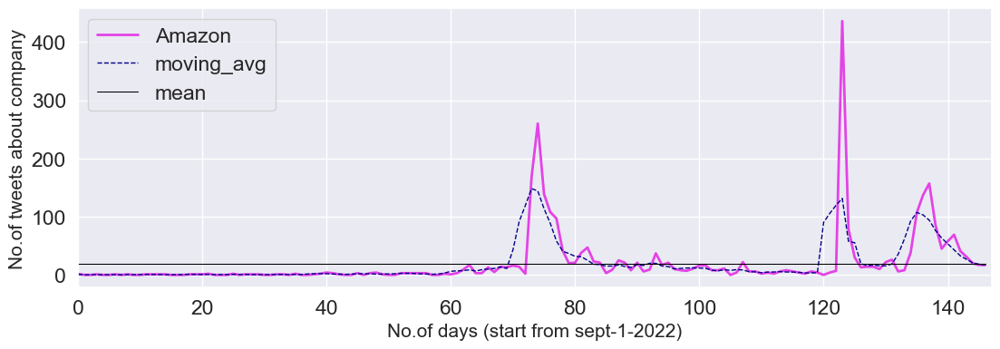

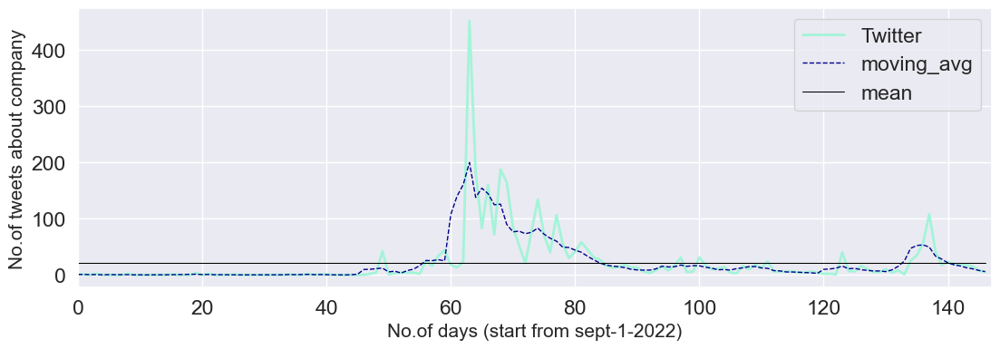

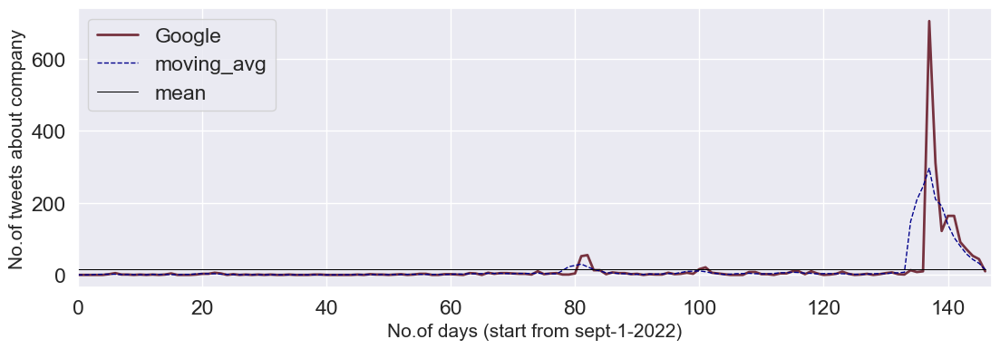

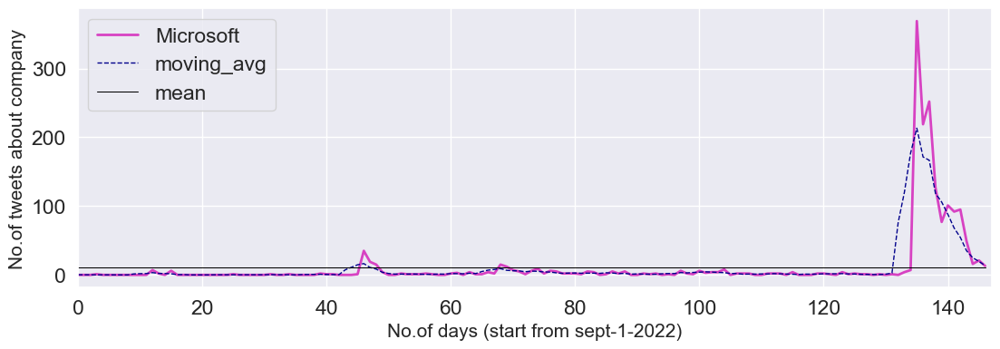

...

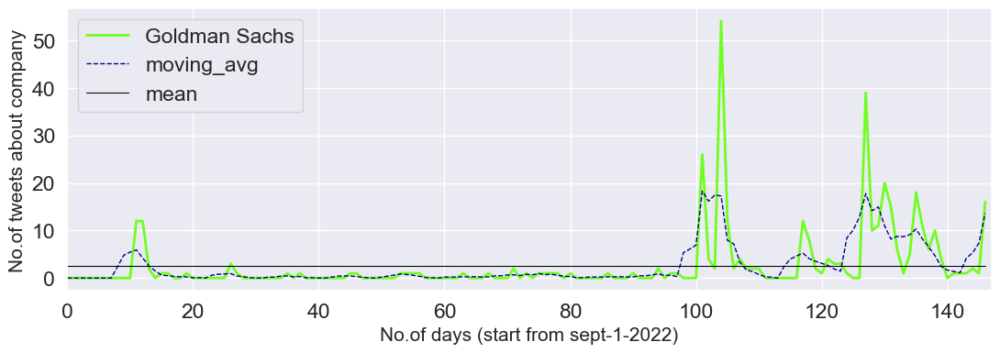

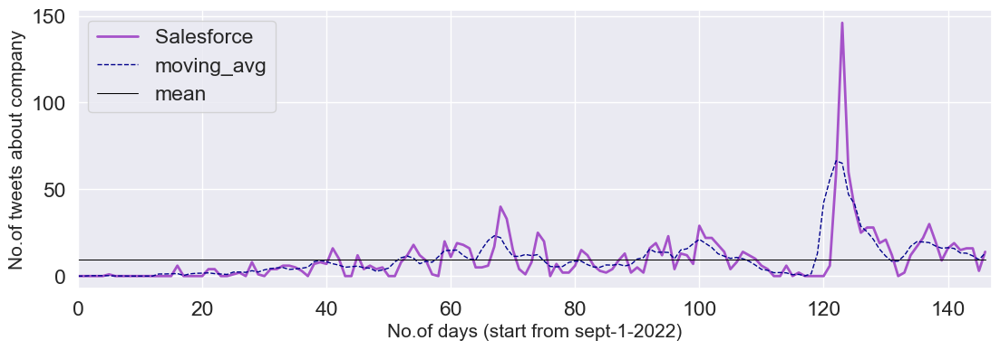

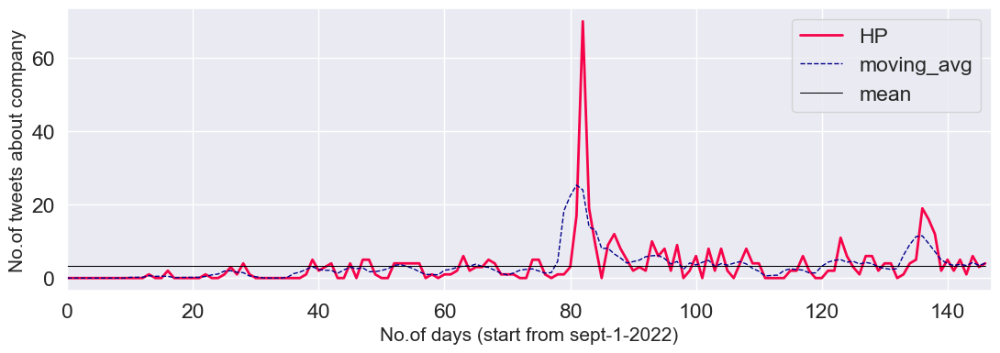

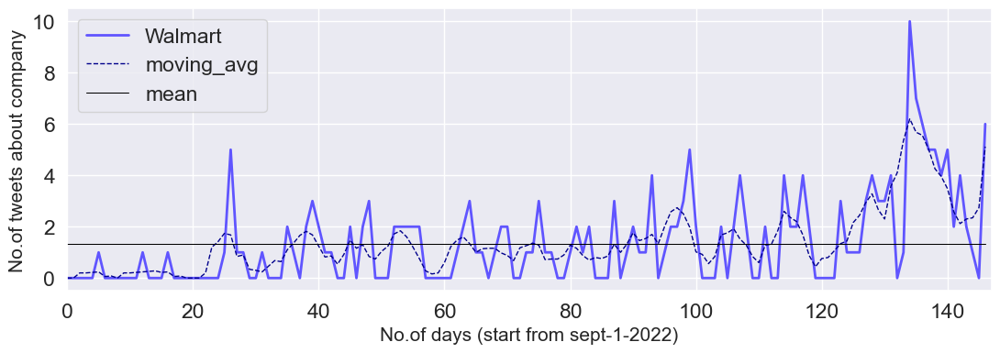

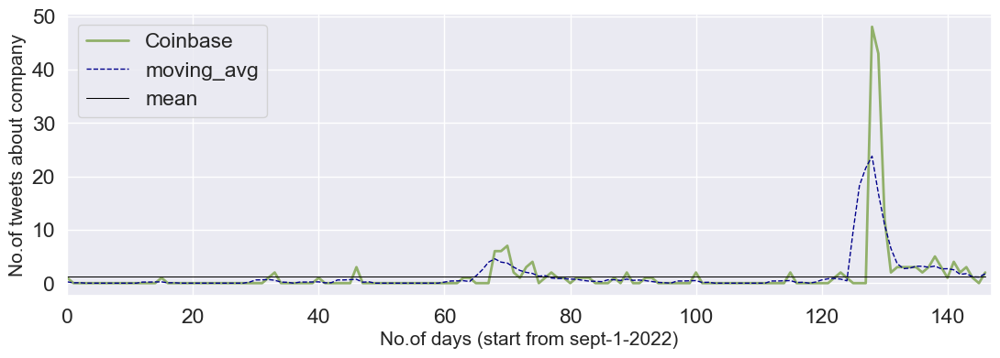

In [575]:
def gen_diff_colors(n):
    hexadecimal_alphabets = '0123456789ABCDEF'
    color = ["#" + ''.join([random.choice(hexadecimal_alphabets) for j in range(6)]) for i in range(n)]
    return color


def print_induvidual_hist_comp(mov_avg_dict_comp,comp_hist_dict ,color_arr):

    i = 0
    for k in comp_hist_dict.keys():
        
    
        
#         mov_avg = moving_average(comp_hist_dict[k], 5)
# #         smooth_curve = get_smoothen_curve(k, comp_hist_dict, sigma_y = 1.25)
#         mov_avg1 = triangular_moving_average(comp_hist_dict[k], 7)
        
#         ratio = 0.8
#         favg = (1-ratio)*np.array(mov_avg)+ ratio*np.array(mov_avg1)
    
        favg = mov_avg_dict_comp[k]
    
        plt.figure(figsize=(13, 4))
        plt.plot(comp_hist_dict[k], label= k, linewidth = 2, c = color_arr[i])
        plt.plot(favg, label= "moving_avg", linestyle = "--",linewidth = 1, c = "darkblue")
        plt.plot([np.mean(favg) - 0.05*np.mean(favg)]*(len(favg)), label= "mean", linewidth = 0.75, linestyle = "-", c = "black")

#         plt.plot(smooth_curve, label= "smoothened curve", linestyle = "--",linewidth = 1, c = "darkblue")
#         plt.plot([np.mean(smooth_curve)]*(len(mov_avg)), label= "mean", linewidth = 0.75, linestyle = "-", c = "black")


        
        plt.legend(loc='best')
        plt.xlim((0, len(comp_hist_dict[list(comp_hist_dict.keys())[0]])))
        plt.xlabel("No.of days (start from sept-1-2022)", fontsize = 15)
        plt.ylabel("No.of tweets about company", fontsize = 15)
        plt.show()
        i += 1
    
color_palletes = gen_diff_colors(len(companies))
print_induvidual_hist_comp(mov_avg_dict_comp, comp_hist_dict, color_palletes)

In [406]:
comp_hist_dict.keys()

dict_keys(['Meta', 'Amazon', 'Twitter', 'Google', 'Microsoft', 'Oracle', 'Cisco', 'Goldman Sachs', 'Salesforce', 'HP', 'Walmart', 'Coinbase'])

In [407]:
# def custom_mv_avg(comp_hist_dict, ratio = 0.2):
    
#     mov_avg_dict_comp = {}

#     for k in comp_hist_dict.keys():

#         mov_avg = moving_average(comp_hist_dict[k], num_steps=7)
#         mov_avg1 = triangular_moving_average(comp_hist_dict[k],window_size=7)
        
#         favg = (1-ratio)*np.array(mov_avg)+ ratio*np.array(mov_avg1)
        
#         mov_avg_dict_comp[k] = favg
        
#     return mov_avg_dict_comp

# mov_avg_dict_comp = custom_mv_avg(comp_hist_dict)

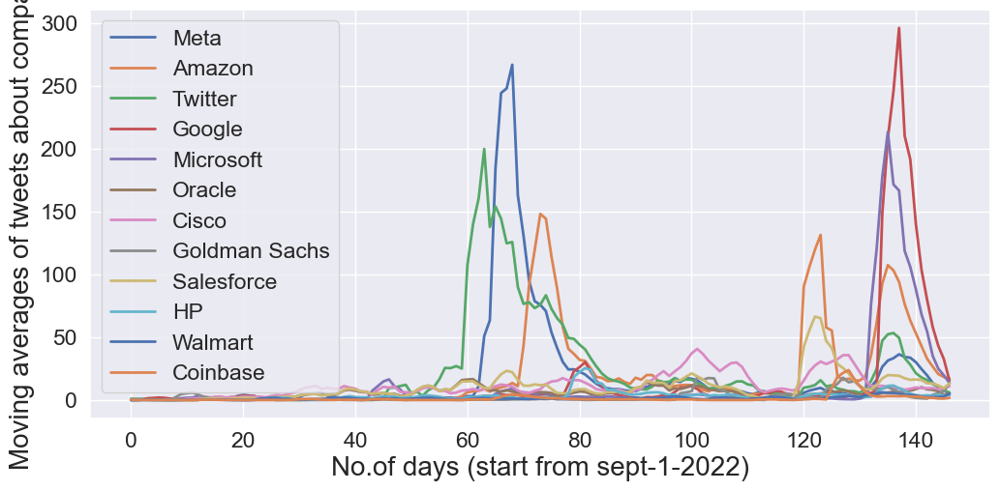

In [576]:
plt.figure(figsize=(12,5.5))

for k in mov_avg_dict_comp.keys():
    
    plt.plot(mov_avg_dict_comp[k], label= k, linewidth = 2)
    
    
plt.legend(loc='best')
plt.xlabel("No.of days (start from sept-1-2022)", fontsize = 20)
plt.ylabel("Moving averages of tweets about company", fontsize = 20)
plt.show()

**From all the above histograms ,we could see that the big-tech giant companies like Google, Twitter, Amazon, Meta,.. are represented by the huge peaks and the others have relatively less amplitude than these**

## **Getting the seasonal peaks and trends from the data**

In [409]:
def get_continuous_intervals(data, threshold):
    intervals = []
    start = None
    end = None
    for i, value in enumerate(data):
        if value >= threshold:
            if start is None:
                start = i
            end = i
        elif end is not None:
            intervals.append((start, end))
            start = None
            end = None
    if end is not None:
        intervals.append((start, end))
    return intervals


def get_peaked_timeind(company, mov_avg_arr):
    
    th = np.mean(mov_avg_arr) - 0.05*np.mean(mov_avg_arr)
    intervals = get_continuous_intervals(mov_avg_arr, th)
    
    return intervals

def filter_intervals(intervals, days_th):
    
    diff_arr = []
    for interval in intervals:
        diff = interval[1] - interval[0]
        diff_arr.append(diff)
    

    op_arr = []
    for i in range(len(diff_arr)):
        if diff_arr[i] >= days_th:
            op_arr.append(intervals[i])
            
    return op_arr

In [410]:
companies

['Meta',
 'Amazon',
 'Twitter',
 'Google',
 'Microsoft',
 'Oracle',
 'Cisco',
 'Goldman Sachs',
 'Salesforce',
 'HP',
 'Walmart',
 'Coinbase']

In [598]:
comp = companies[2]

comp_intervals = get_peaked_timeind(comp, mov_avg_dict_comp[comp])

days_th = 4
comp_intervals = filter_intervals(comp_intervals, days_th)

def plot_intervals(intervals, data, threshold, figsize=(15, 8), title=None):
    plt.figure(figsize=figsize)
    plt.plot(data)
    plt.axhline(y=threshold, color='r', linestyle='--', label = "threshold ={:.2f}".format(threshold))
    for interval in intervals:
        plt.axvspan(interval[0], interval[1], color='g', alpha=0.5)
    if title:
        plt.title(title)
    plt.xlabel("index")
    plt.ylabel("No.of tweets")
    plt.legend()
    plt.show()



# th = np.mean(mov_avg_dict_comp[comp]) - 0.10*np.mean(mov_avg_dict_comp[comp])
# title = "No.of posts about " + comp
# plot_intervals(comp_intervals, mov_avg_dict_comp[comp], th, figsize=(12,3), title = title)


In [599]:
def plot_waves(company, x_th = 4,figsize=(10, 5)):
    
    
    comp = company

    comp_intervals = get_peaked_timeind(comp, mov_avg_dict_comp[comp])

    comp_intervals = filter_intervals(comp_intervals, x_th)



#     th = np.mean(mov_avg_dict_comp[comp]) - 0.10*np.mean(mov_avg_dict_comp[comp])
    th = np.mean(mov_avg_dict_comp[comp])
    title = "No.of tweets about " + comp
    plot_intervals(comp_intervals, mov_avg_dict_comp[comp], th, figsize=figsize, title = title)


In [600]:
temp_df = pd.DataFrame(df1_copy_indfix['Date'].dt.date)
temp_df.index = [i for i in range(len(temp_df))]
    
q = '''
        SELECT DISTINCT(Date) AS date FROM temp_df
    '''
all_dates_df = duckdb.query(q).to_df()

all_dates_list = list(all_dates_df["date"])
print(len(all_dates_list))

147


In [601]:
get_peaked_timeind("Google", mov_avg_dict_comp["Google"])

[(79, 83), (134, 146)]

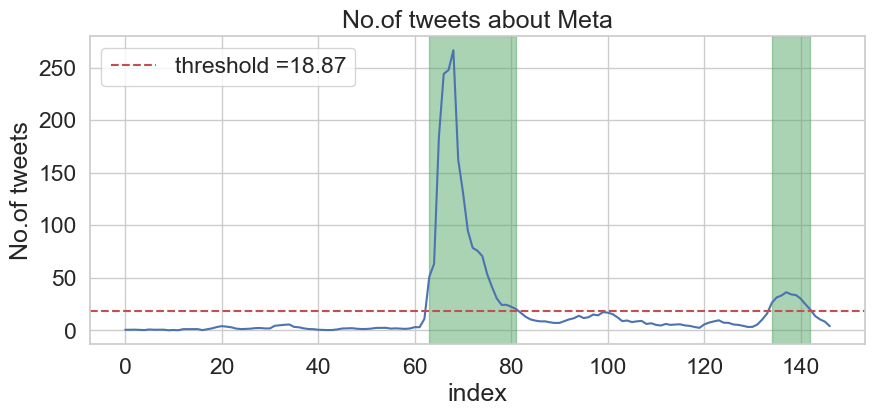

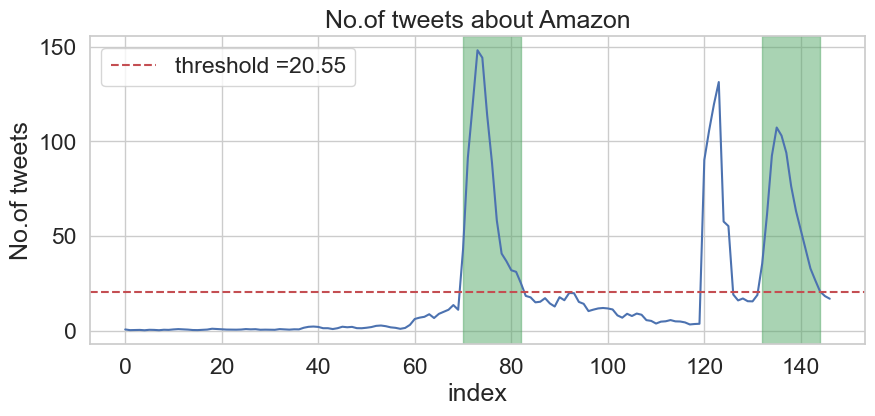

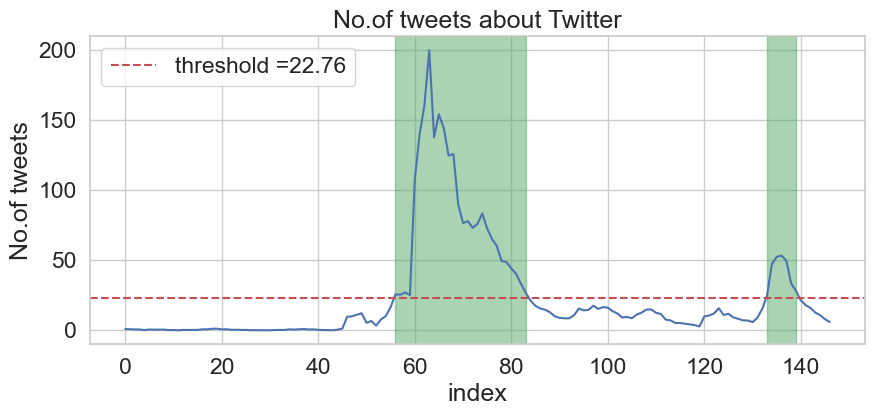

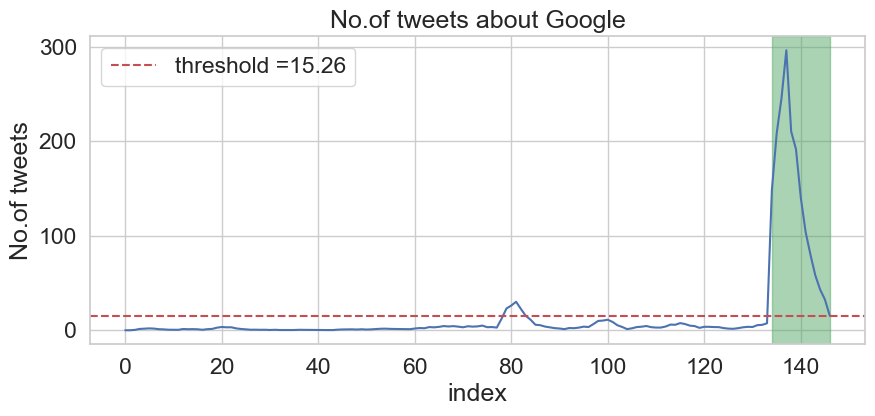

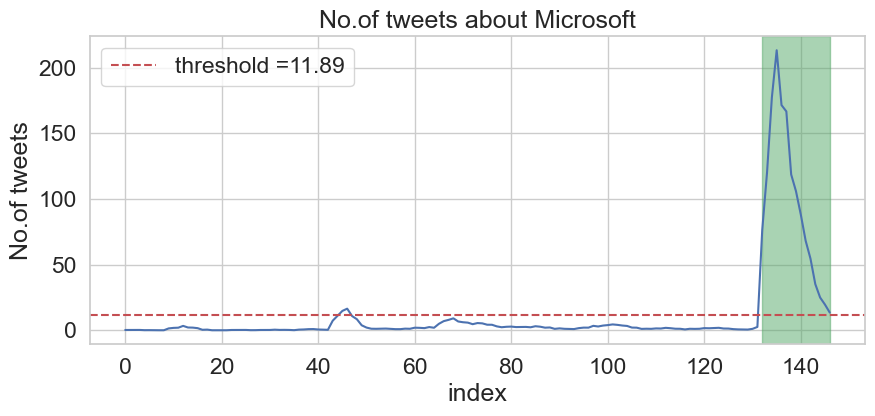

...

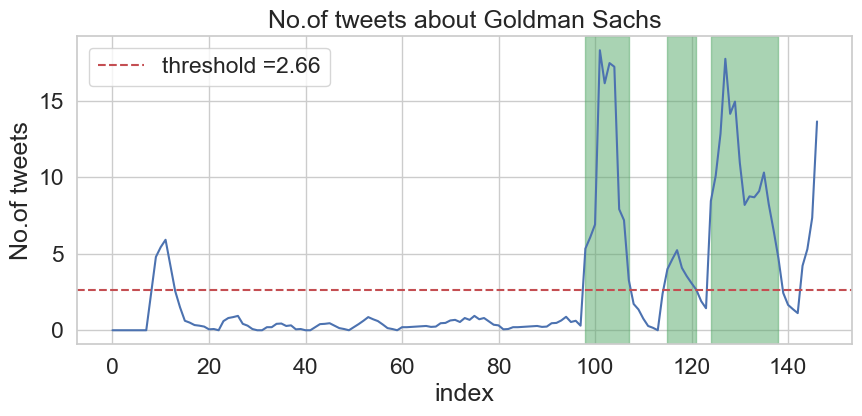

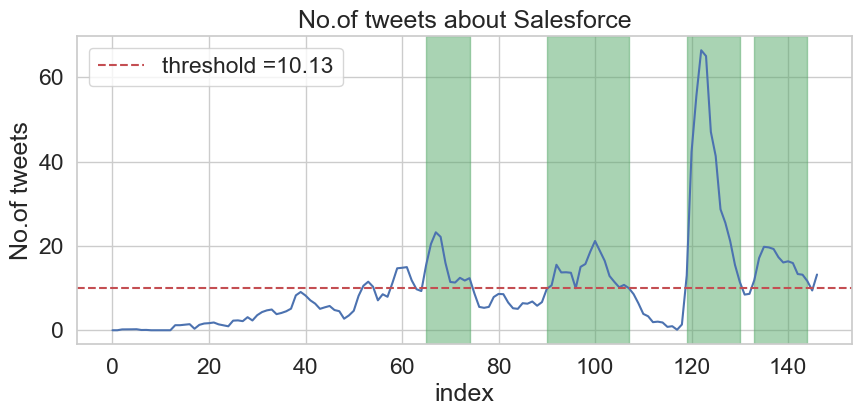

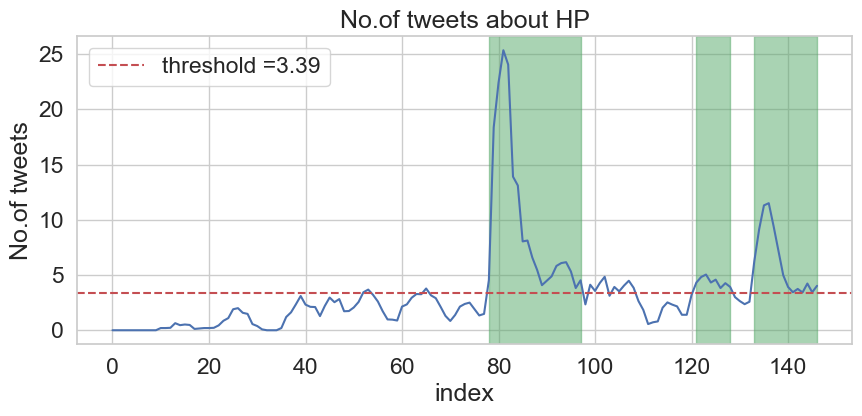

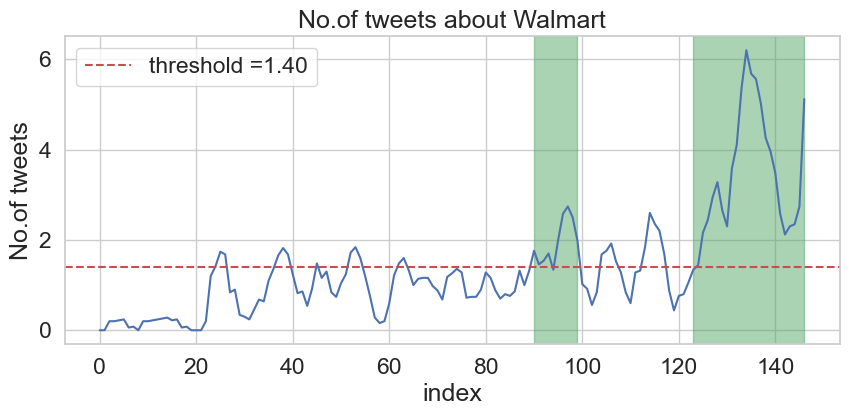

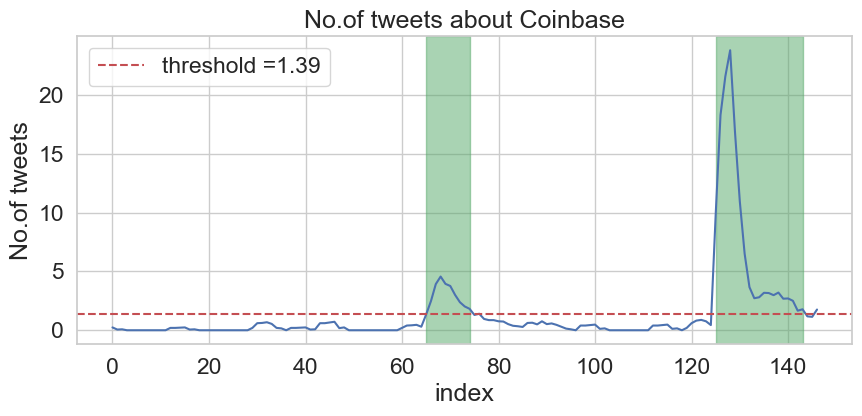

In [602]:
for c in companies:
    plot_waves(c, figsize=(10,4),x_th=6)

In [603]:
def get_tweets_hist_comp(df, compname, interval, dates_arr):
    
    req_df = df[(df["Date"] > dates_arr[interval[0]]) & (df["Date"] < dates_arr[interval[1]]) & (df[compname] == 1)]
    
    return req_df

def get_word_clouds_comp_chrono(company, mov_avg_dict, df , dates_arr, th = 4, figsize = (10,8)):
    
    comp_intervals = get_peaked_timeind(company, mov_avg_dict_comp[comp])
    days_th = th
    comp_intervals = filter_intervals(comp_intervals, days_th)
    
    i = 0
    for interval in comp_intervals:
        temp_df =  get_tweets_hist_comp(df, company, interval, dates_arr)
        
        curr_tweets = ""
        
        for t in temp_df["Tweet"]:
            curr_tweets += t
        
        
        print("Interval ", i, "->", dates_arr[interval[0]] , "to", dates_arr[interval[1]])
        stopwords = set(STOPWORDS)
        wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(curr_tweets)
        plt.figure( figsize=(10,8))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        i += 1


In [417]:
df1_copy1 = df1_copy_indfix.copy()

df1_copy1['Tweet'] = df1_copy1['Tweet'].apply(lambda z: clean_text_complete(z))

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\ '
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\ '
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\_'
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\G'
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")


In [418]:
# get_word_clouds_comp_chrono("Amazon", mov_avg_dict_comp, df1_copy1 , all_dates_list, th = 4)

In [419]:
# def get_tweets_hist_comp(df, compname, interval, dates_arr):
    
#     req_df = df[(df["Date"] > dates_arr[interval[0]]) & (df["Date"] < dates_arr[interval[1]]) & (df[compname] == 1)]
    
#     return req_df

def get_text_summary_comp_chrono(company, mov_avg_dict, df , dates_arr, summarizer,th = 4):
    
    comp_intervals = get_peaked_timeind(company, mov_avg_dict[company])
    days_th = th
    comp_intervals = filter_intervals(comp_intervals, days_th)
    print(comp_intervals)
    
    op_dict = {}
    
    i = 0
    for interval in comp_intervals:
        
        
        temp_df =  get_tweets_hist_comp(df, company, interval, dates_arr)
        
#         mov_avg_dict
#         max_ind = 0
#         max_tweets = 0
#         for j in range(interval[0], interval[1]+1):
#             if mov_avg_dict[company][j] > max_tweets:
#                 max_ind = j
#                 max_tweets = mov_avg_dict[company][j] 
                
        
#         print(max_tweets, max_ind)
#         print("Interval ", i, "->", dates_arr[interval[0]] , "to", dates_arr[interval[1]])
        
        summary_pres = ""
        for j in range(interval[0], interval[1]+1, 7):
            
            
            curr_tweets = ""
            
            for t in temp_df.iloc[j:j+7]["Tweet"]:
                curr_tweets += t
                    
#             tweets_len = len(curr_tweets)
        
            summary = summarizer(curr_tweets, min_length = 10, max_length = 120)
            summary_txt = summary[0]["summary_text"]

            summary_pres += summary_txt
            summary_pres += " "
            
            
        op_dict[interval] = summary_pres
        
#         print(summary_pres)
#         print()
        
        i += 1
        
    return op_dict


In [420]:
from transformers import pipeline

summarizer_bart = pipeline("summarization", model="philschmid/bart-large-cnn-samsum")

In [421]:
def print_summaries_comapany(comapany_name, summarizer ,mov_avg_dict, df, all_dates_list, th = 4):
    text_summaries = get_text_summary_comp_chrono(comapany_name, mov_avg_dict, df , all_dates_list, summarizer ,th = 4)
    
    for k in text_summaries.keys():
        curr_content = text_summaries[k]
        print(all_dates_list[k[0]].date(), "to", all_dates_list[k[1]].date(), ":-\n")
        print(curr_content)
        print("\n\n")

In [422]:
# mov_avg_dict_comp 

In [423]:
print_summaries_comapany("Salesforce", summarizer_bart, mov_avg_dict_comp, df1_copy1,all_dates_list)

[(58, 63), (65, 74), (90, 107), (119, 130), (133, 144)]
2022-10-30 to 2022-11-04 :-

Mike Sicilia was laid off in oci object storage.  



2022-11-06 to 2022-11-15 :-

Software company salesforce confirms it has laid off hundreds of employees. There have been a lot of layoffs in the tech industry recently. Salesforce is planning to lay off as many as 2500 employees in a fresh round of job cuts. 



2022-12-02 to 2022-12-19 :-

Oracle is going to lay off more employees.  Oracle is about to have a massive layoff in January. There will be another 10k+ cuts in February. The oracle world turns week of 1127. Salesforce will start another fresh round of layoffs. 



2022-12-31 to 2023-01-12 :-

The layoff layoffs layoff jobcuts rifsssap layoffs 2023, sap sapag newtownsquare pennsylvania, oracle layoffs, bangalore burlington austin techjobs, orclsalesforce. The week of 11 is the week of the oracle layoffs. Salesforce needs to lay off another 40 people. Cisco wants to hire the rejects from Sale

In [424]:
print_summaries_comapany("Google", summarizer_bart, mov_avg_dict_comp, df1_copy1,all_dates_list)

[(79, 83), (134, 146)]


Your max_length is set to 120, but you input_length is only 3. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=1)
Your max_length is set to 120, but you input_length is only 3. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=1)


2022-11-20 to 2022-11-24 :-

Googlegoogle will lay off 10000 employees based on performance in 2022. 



2023-01-16 to 2023-01-17 :-

"I am a prisoner of the state" is a quote from William Shakespeare. "I am a prisoner of the state" is a quote from William Shakespeare. 





In [425]:
from transformers import AutoTokenizer, AutoModelForTokenClassification
from transformers import pipeline

tokenizer_ner = AutoTokenizer.from_pretrained("dslim/bert-base-NER")
model_ner = AutoModelForTokenClassification.from_pretrained("dslim/bert-base-NER")

ner_pipeline = pipeline("ner", model=model_ner, tokenizer=tokenizer_ner)

In [426]:
# example = "Elon musk intends to start laying off twitter staff days after completing the usd 44 billion acquisition.  Elonmusk musk has ordered layoffs at Twitter. He took Twitter private for 44 billion dollars. The layoffs at twitter would take place before the November 1 date when employees were scheduled to receive stock grants as part of their compensation. Elonmusk fired twitter execs in an attempt to avoid payouts. The wall street journal twitter braces for mass layoffs under new owner Elon Musk."

# ner_results = ner_pipeline(example)
# print(ner_results)

In [427]:
text = '''Worth underscoring what others have pointed out today re: the #Gannett #layoffs. A lot of these affected folks seem to have had digital/online responsibilities, bizarre given the message that we worker bees receive is all-digital-all-the-time, online is the future etc.
#Layoffs have become an unfortunate holiday tradition @gannett &amp; @usatoday, but #Gannett's loss can be your gain. I will tweet and retweet #journojobs as I get them. Please send journalism job openings my way. #journalismmatters #supportjournalism
Attn #layoffs - we are hiring in NYC for Consumer PM, DevOps, MLOps, Technical Program Manager, Community Manager. Apply and come search for UAP with us: https://t.co/v16WyzmzH0'''

summarizer_bart(text)

[{'summary_text': 'Gannett is laying off a lot of people with digital and online responsibilities. They are hiring in NYC for Consumer PM, DevOps, MLOps, Technical Program Manager, Community Manager and UAP manager positions. The job openings are available in New York.'}]

In [428]:
NER = spacy.load("en_core_web_sm")


def get_ner_comp_chrono(company, mov_avg_dict, df , dates_arr, th = 4):
    
    comp_intervals = get_peaked_timeind(company, mov_avg_dict_comp[comp])
    days_th = th
    comp_intervals = filter_intervals(comp_intervals, days_th)
    
    i = 0
    for interval in comp_intervals:
        temp_df =  get_num_tweets_hist_comp(df, company, interval, dates_arr)
        
        print(temp_df["Tweet"])
        
        

# raw_text="The Indian Space Research Organisation or is the national space agency of India, headquartered in Bengaluru. It operates under Department of Space which is directly overseen by the Prime Minister of India while Chairman of ISRO acts as executive of DOS as well."
# text1= NER(raw_text)
# for word in text1.ents:
#     print(word.text,word.label_)
# displacy.render(text1,style="ent",jupyter=True)

In [429]:
# get_ner_comp_chrono("Meta", mov_avg_dict_comp, df1_copy , all_dates_list)

In [430]:
si = 44
for t in df1_copy["Tweet"].iloc[si:si + 10]:
    print(t)
    print()

Bearish Thoughts Persist in a Bull Market. - https://t.co/stieR9wIVR     #ATT   #business  #humanresource  #layoffs https://t.co/VYI2aI5zOK

Here it is. The housing market is in recession. #recession #economy #layoffs 

https://t.co/gUb1zep1CZ

A wave of #layoffs is sweeping the US. Here are firms that have announced cuts so far, from #Peloton to #Snap . #jobs  https://t.co/9XCXXGMabD

Households face the biggest squeeze in living standards for 100 years https://t.co/SfGVuv60f7 via @MetroUK
#CostOfLivingCrisis #CostOfGreedCrisis #poverty #deprivation #Crisis mass #Hunger #starvation #squalor #layoffs #homelessness across the #uk 
2022 2023 2024 2025 be #hell

#BedBathBeyond to #Close 150 #Stores, #Layoff 20% of #Employees Amid #Financial Struggles - The retailer's sales are down approximately 26% compared to the same fiscal quarter last year
https://t.co/2dyswlqYm9

Our employee separations technology isn't just for HR. Onwards HR helps out Finance teams, too. https://t.co/mfGAEWhfgF. 

# Analysing LinkedIn posts

In [431]:
df2 = pd.read_csv("linkedin_merged.csv")
print(df2.shape)

(40371, 7)


In [432]:
def convert_atr(data):
    conv_data = re.sub(r"@", " at ", data)
    return conv_data

def convert_and(data):
    conv_data = re.sub(r"&", " and ", data)
    return conv_data

def convert_comma(data):
    conv_data = re.sub(r"|", ", ", data)
    return conv_data

In [433]:
temp_jobs = df2.copy()
temp_jobs.shape

(40371, 7)

In [434]:
temp_jobs["job"] = temp_jobs["job"].apply(lambda z: remove_hashsymbol(z))
temp_jobs["job"] = temp_jobs["job"].apply(lambda z: convert_atr(z))
temp_jobs["job"] = temp_jobs["job"].apply(lambda z: convert_and(z))
temp_jobs["job"] = temp_jobs["job"].apply(lambda z: clean_text_complete(z))

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\M'
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\V'
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")


In [435]:
del temp_jobs["Unnamed: 0"]
temp_jobs.reset_index(inplace = True)
del temp_jobs["index"]

# **Analysing the posts scrapped based on the job title and designation**

Analysis of the data on a whole based on the occupation of the person posting about layoffs.

In [436]:
def get_shortform(role):
    role_comps = role.split(" ")
    if len(role_comps) > 1:
        sf = ""
        for r in role_comps:
            sf += r[0]

        return sf
    
    else:
        return role
    
def get_sf_dict(arr):
    
    dict1 = {}
    
    for i in range(n):
        curr_name = arr[i]
        curr_sf = get_shortforms(curr_name)
        
        dict1[curr_sf] = curr_name
        
    return dict1

In [437]:
top_lvl = ["ceo","cmo" ,"cso ", "cco", "coo" , "cto", "cao" ,"chief executive officer", "chief marketing officer","chief sales officer" ,"chief coordinating officer", "chief administrative officer", "chief technology officer" ,"chief operating officer", "chief of staff","executive director", "president", "vice president", "managing director", "md", "chairman", "chairperson", "non executive director", "owner", "founder", "co founder", "cofounder" ,"co-founder" ,"non executive director", "executive vice presisdent", "executive president", "chief people officer", "executive director", "global head", "chief revenue officer", "cro", "founding member", "board of directors", "vice chancellor", "chancellor", "vp", "director of", "associate director"]
len(top_lvl)


43

In [438]:
mid_lvl = ["finance manager" ,"product manager", "project manager" , "research manager", "proposal manager", "business manager" , "administrative manager" , "development manager", "senior manager" ,"branch manager", "purchase manager", "staff manager", "operation manager", "head", "project lead", "project head", "team lead", "recruitment manager", "hr", "hr manager", "human resource manager", "project coordinator", "coordinator", "project head", "recruiter", "head of", "leader of", "supply chain manager", "social media manager", "associate principals", "ap", "principal associate", "pa", "management", "program manager", "programme manager", "account manager", "branch manager", "senior", "delivery lead", "marketing manager", "sr", "senior", "dean", "general manager", "avp", "assistant vice president", "account director", "associate engineer" , "ae", "digital marketing director"]
len(mid_lvl)


51

In [439]:
low_lvl = ["engineer", "instructor", "career coach", "career instructor", "trainer", "data scientist", "designer", "analyst", "author", "social media handler", "se", "sde", "swe", "advisor", "business development executive", "bde", "sme", "scientist", "strategist", "specialist", "proposal writer", "banker", "mle", "connector", "researcher", "intern", "content creator", "creator", "software developement engineer", "rpo", "recruitment process outsourcing", "social worker", "operator", "consultant", "developer", "ux enginnering", "engineering", "stundent", "writer", "author", "freelance", "freelancer", "blogger", "inspector", "supervisor", "junior manager", "devop", "customer experience professional", "open to work", "entrepreneur", "adjuster", "editor", "journalist", "mentor", "coach",  "teacher", "developer", "economist", "scholar", "research scholar", "professor", "lecturer", "interviewer", "consultant", "reporter", "free lance", "free lancer", "programmer", "coder", "hacker", "doctor", "influencer", "photographer", "engineering", "problem solver", "storyteller", "marketing executive", "hr", "accountant", "blogger", "account manager", "followers", "customer account manager", "representative", "advisor", "architect", "research", "analysis", "assistant", "marketing specialist", "hr specialist", "learning", "open to", "actively looking", "mba", "bba", "btech", "bsc", "msc", "mtech", "technical sourcer", "system enigneer", "assistant engineer", "investor", "investment analyst", "realtor", "recruiting leader", "recruitment manager", "analytics leader", "data leader", "data engineer", "data analyst","resources manager", "commercial manager", "portfolio manager", "speaker", "finance executive", "quality assurance director", "actively hiring", "hiring", "fresher", "animator", "shareholder", "broker", "sales professional", "enthusiast"]
len(low_lvl)


126

In [440]:
all_lvls = top_lvl.copy()

all_lvls += mid_lvl
all_lvls += low_lvl

In [441]:
def match_word(text, word):
    pattern = re.compile(r'\b' + word + r'\b')
    match = re.search(pattern, text)
    if match:
        return True
    else:
        return False
    
def get_num_posts(df, job_title):
    c = 0
    sf = get_shortform(job_title)
    for i in range(len(df)):
        if match_word(df.iloc[i]["job"], job_title) or match_word(df.iloc[i]["job"], sf):
            c += 1
    return c

def get_job_ind(df, job_title):
    ind = []
    sf = get_shortform(job_title)
    for i in range(len(df)):
        if match_word(df.iloc[i]["job"], job_title) or match_word(df.iloc[i]["job"], sf):
            ind.append(i)
            
    return ind

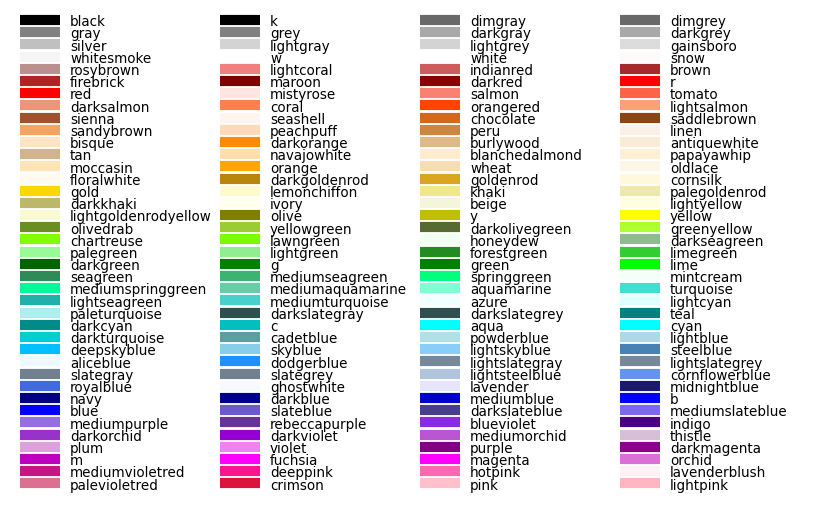

In [442]:
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors


colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)

# Sort colors by hue, saturation, value and name.
by_hsv = sorted((tuple(mcolors.rgb_to_hsv(mcolors.to_rgba(color)[:3])), name)
                for name, color in colors.items())
sorted_names = [name for hsv, name in by_hsv]

n = len(sorted_names)
ncols = 4
nrows = n // ncols + 1

fig, ax = plt.subplots(figsize=(8, 5))

# Get height and width
X, Y = fig.get_dpi() * fig.get_size_inches()
h = Y / (nrows + 1)
w = X / ncols

for i, name in enumerate(sorted_names):
    col = i % ncols
    row = i // ncols
    y = Y - (row * h) - h

    xi_line = w * (col + 0.05)
    xf_line = w * (col + 0.25)
    xi_text = w * (col + 0.3)

    ax.text(xi_text, y, name, fontsize=(h * 0.8),
            horizontalalignment='left',
            verticalalignment='center')

    ax.hlines(y + h * 0.1, xi_line, xf_line,
              color=colors[name], linewidth=(h * 0.6))

ax.set_xlim(0, X)
ax.set_ylim(0, Y)
ax.set_axis_off()

fig.subplots_adjust(left=0, right=1,
                    top=1, bottom=0,
                    hspace=0, wspace=0)
plt.show()

In [443]:
temp0 = '''Technical:Engineer, Data Scientist, Designer, Analyst, Software Development Engineer, Developer, UX Engineer, Student, Programmer, Coder, Hacker, System Engineer, Assistant Engineer, Technical Sourcer, SE, SDE, SWE, UX engineer, engineering, assistant engineer, system engineer'''

temp1 = '''Academic:Instructor, Career Coach, Career Instructor, Trainer, Scientist, Researcher, Intern, Scholar, Research Scholar, Professor, Lecturer, Economist, BTech, BSc, MSc, MTech, Teacher, Influencer'''

temp2 = '''Creative:Author, Social Media Handler, Content Creator, Creator, Writer, Freelance, Freelancer, Blogger, Photographer, Storyteller, Animator'''

temp3 = '''Business:Business Development Executive, SME, Strategist, Specialist, Proposal Writer, Banker, Connector, Advisor, Marketing Executive, Accountant, Account Manager, Customer Account Manager, Representative, Architect, Marketing Specialist, HR Specialist, MBA, BBA, Sales Professional'''

temp4 = '''Finance:Investor, Investment Analyst, Realtor, Finance Executive, Shareholder, Broker'''

temp5 = '''Media:Journalist, Interviewer, Reporter, Editor, Photographer'''

temp6 = '''Leadership and Management:CEO, CMO, CSO, CCO, COO, CTO, CAO, Chief of Staff, Executive Director, President, Vice President, Managing Director, MD, Chairman, Chairperson, Non-Executive Director, Executive Vice President, Executive President, Chief People Officer, Global Head, Chief Revenue Officer, Founding Member, Board of Directors, Vice Chancellor, Chancellor, Director of, Associate Director'''

temp7 = '''Human Resources:HR, Assistant, Learning, Resources Manager'''


def get_domain(str_dom):
    
    temps = str_dom.split(":")
    
    domain = temps[0]
    
    jobs = temps[1].split(", ")
    
    i = 0
    n = len(jobs)
    while i < n:
        j = jobs.pop(0)
        
        jobs.append(j.lower())
        
        i += 1
        
    dicop = {}
    dicop[domain] = jobs
    
    return dicop


In [444]:
dic0 = get_domain(temp0)
dic1 = get_domain(temp1)
dic2 = get_domain(temp2)
dic3 = get_domain(temp3)
dic4 = get_domain(temp4)
dic5 = get_domain(temp5)
dic6 = get_domain(temp6)
dic7 = get_domain(temp7)

dom_arr = [dic0,dic1,dic2,dic3,dic4,dic5,dic6,dic7]

domain_dic = {}

for dic in dom_arr:
    domain_dic[list(dic.keys())[0]] = dic[list(dic.keys())[0]]

In [445]:
# temp_jobs["job"]
# get_num_posts(temp_jobs, "ceo")

domain_freq = {}
tot_domain_freq = {}

for k in domain_dic.keys():
    
    domain_freq[k] = 0
    tot_domain_freq[k] = {}
    
    curr_dom = domain_dic[k]
    
    tot_num = 0
    for cj in curr_dom:
        cnum = get_num_posts(temp_jobs, cj)
        
        tot_domain_freq[k][cj] = cnum
        tot_num += cnum
        
    domain_freq[k] = tot_num

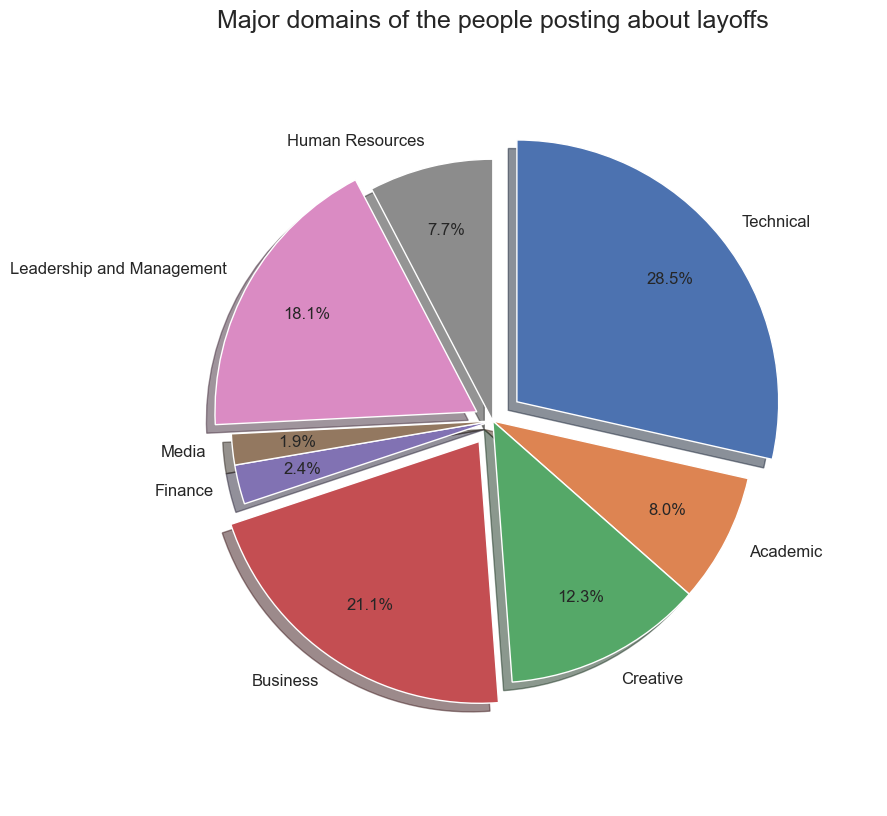

In [710]:
fig = plt.figure(figsize=(10,10))

# colormap1=['firebrick','LightCoral','Salmon','DarkSalmon','mistyrose', "crimson"]
# colormap1 = sorted_names[140:148]

colormap1 = sorted_names[20:28]
# , colors=colormap1
plt.pie(domain_freq.values() ,labels=domain_freq.keys(),startangle=90, explode=[0.1,0,0,0.08,0,0,0.06,0], pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.85, textprops={'fontsize': 12})
plt.title("Major domains of the people posting about layoffs")
plt.show()

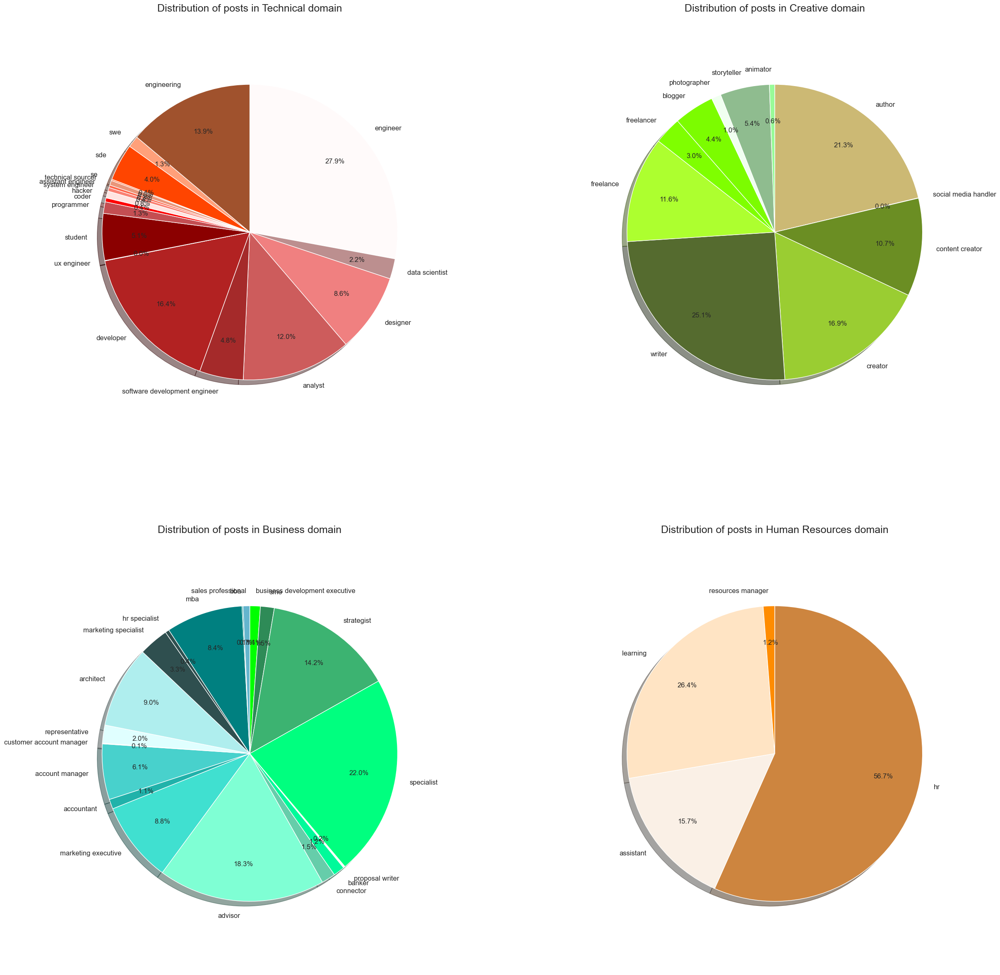

In [714]:
doms = list(tot_domain_freq.keys())


fig = plt.figure(figsize=(30,30))


curr_domname = doms[0]
colormap1 = sorted_names[15:15+len(tot_domain_freq[curr_domname])]
plt.subplot(2,2,1)
# , colors=colormap1
plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1 ,labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.85, textprops={'fontsize': 12})
plt.title("Distribution of posts in " + curr_domname + " domain")


curr_domname = doms[2]
colormap1 = sorted_names[66:66+len(tot_domain_freq[curr_domname])]
plt.subplot(2,2,2)
# , colors=colormap1
plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1 ,labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.85, textprops={'fontsize': 12})
plt.title("Distribution of posts in " + curr_domname + " domain")


curr_domname = doms[3]
colormap1 = sorted_names[83:83+len(tot_domain_freq[curr_domname])]
plt.subplot(2,2,3)
plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1 ,labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.85, textprops={'fontsize': 12})
plt.title("Distribution of posts in " + curr_domname + " domain")


curr_domname = doms[4]
curr_domname = doms[7]
colormap1 = sorted_names[38:38+len(tot_domain_freq[curr_domname])]
plt.subplot(2,2,4)
plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1 ,labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.85, textprops={'fontsize': 12})
plt.title("Distribution of posts in " + curr_domname + " domain")

plt.subplots_adjust(wspace=None, hspace=None)
plt.show()

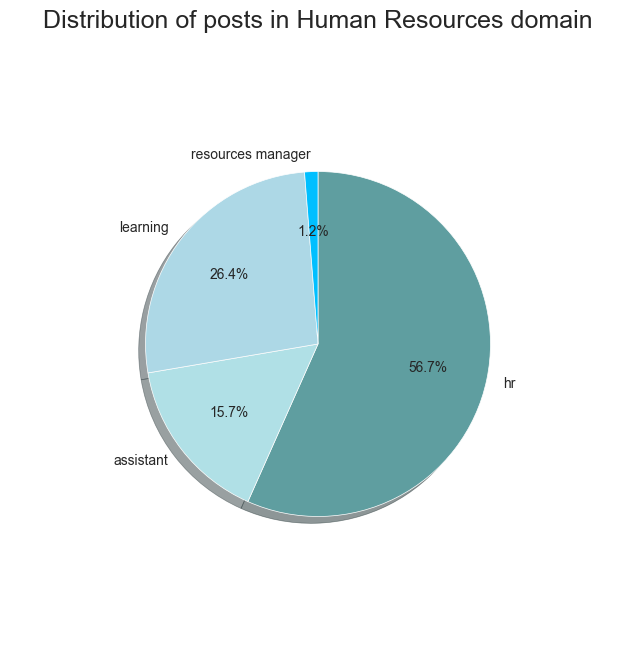

In [580]:
doms = list(tot_domain_freq.keys())
curr_domname = doms[7]
fig = plt.figure(figsize=(8,8))

si = 105
colormap1 = sorted_names[si:si+len(tot_domain_freq[curr_domname])]
plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1, wedgeprops= {"linewidth" : 0.5},labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.65, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.70, textprops={'fontsize': 10})
plt.title("Distribution of posts in " + curr_domname + " domain")
plt.show()

In [449]:
hr_ind = get_job_ind(temp_jobs, "hr")

In [450]:
# hr_ind
hr_df = temp_jobs.iloc[hr_ind]

In [451]:
hr_df = hr_df.sort_values(by='num_reacts', ascending=False)

In [452]:
hr_df["num_reacts"].describe()

count     1046.000000
mean       139.230402
std       2173.114373
min          0.000000
25%          1.000000
50%          6.000000
75%         23.000000
max      57263.000000
Name: num_reacts, dtype: float64

In [453]:
# temp_df = hr_df[hr_df["num_reacts"] > hr_df["num_reacts"].mean()].sort_values(by='date', ascending=True)

In [454]:
# for i in range(len(temp_df[temp_df["num_reacts"] > temp_df["num_reacts"].mean()])):
#     print("No.of reactions :- ", temp_df[temp_df["num_reacts"] > temp_df["num_reacts"].mean()]["num_reacts"].iloc[i])
#     print(temp_df[temp_df["num_reacts"] > temp_df["num_reacts"].mean()]["text"].iloc[i])
#     print()

In [455]:
# summs = []

# for i in range(0,len(temp_df),4):
#     curr_posts = temp_df[i:i+4]
    
#     curr_text = ""
#     for ct in curr_posts["text"]:
#         curr_text += ct + " "
    
#     summary = summarizer_bart(curr_text, min_length = 50, max_length = 420)
#     summs.append(summary)
    
#     print(summary)
#     print("-----\n")
    

In [456]:
# summarizer_bart = pipeline("summarization", model="philschmid/bart-large-cnn-samsum")
# 
# summary = summarizer(curr_tweets, min_length = 10, max_length = 120)

## Distributuon of posts based on the management levels in the topmost hirearchey of a company


In [457]:
levels = ['Top-Level Management', 'Middle-Level Management', 'Lower-Level Management']

top_level = ['ceo', 'chief executive officer', 'executive director', 'president', 'chairman', 'chairperson', 'owner', 'founder', 'co-founder', 'non-executive director', 'executive vice president', 'executive president']
middle_level = ['cmo', 'chief marketing officer', 'vice president', 'managing director', 'md', 'executive director', 'global head', 'chief people officer', 'executive director', 'chief revenue officer', 'cro', 'founding member', 'board of directors']
lower_level = ['cso', 'cco', 'cao', 'cto', 'coo', 'chief sales officer', 'chief coordinating officer', 'chief administrative officer', 'chief technology officer', 'chief operating officer', 'chief of staff', 'non-executive director', 'vp', 'director of', 'associate director', 'vice chancellor', 'chancellor']

def categorize_management(position):
    if position in top_level:
        return levels[0]
    elif position in middle_level:
        return levels[1]
    elif position in lower_level:
        return levels[2]
    else:
        return 'Level not found'
  

top_seg_dict = {}
for p in levels:
    top_seg_dict[p] = []
    
for p in top_lvl:
    curr_seg = categorize_management(p)
    if curr_seg != 'Level not found':
        top_seg_dict[curr_seg].append(p)

In [458]:
def match_word(text, word):
    pattern = re.compile(r'\b' + word + r'\b')
    match = re.search(pattern, text)
    if match:
        return True
    else:
        return False
    
def get_num_posts(df, job_title):
    c = 0
    sf = get_shortform(job_title)
    for i in range(len(df)):
        if match_word(df.iloc[i]["job"], job_title) or match_word(df.iloc[i]["job"], sf):
            c += 1
    return c

In [459]:
top_seg_dict_vals = {}

for k in top_seg_dict.keys():
    top_seg_dict_vals[k] = {}

for k in top_seg_dict.keys():
    
    for k1 in top_seg_dict[k]:
                
        top_seg_dict_vals[k][k1] = get_num_posts(temp_jobs, k1)

In [460]:
top_seg_dict_vals.keys()

dict_keys(['Top-Level Management', 'Middle-Level Management', 'Lower-Level Management'])

In [461]:
def get_tot_count1(dic):
    c = 0
    for k in dic.keys():
        c += dic[k]
        
    return c

In [462]:
top_lvl_c = get_tot_count1(top_seg_dict_vals["Top-Level Management"])

mid_lvl_c = get_tot_count1(top_seg_dict_vals["Middle-Level Management"])

low_lvl_c = get_tot_count1(top_seg_dict_vals["Lower-Level Management"])

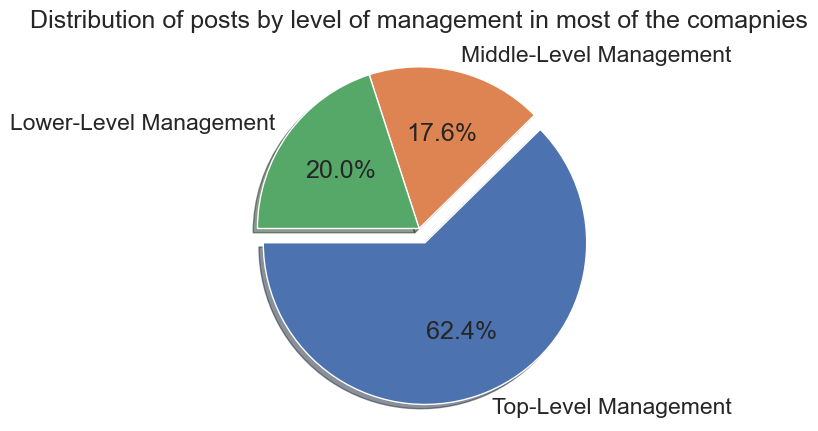

In [604]:
data = [top_lvl_c, mid_lvl_c, low_lvl_c]

# Labels for the pie chart
labels = list(top_seg_dict_vals.keys())

# Plot the pie chart
plt.figure(figsize = (5,5))
plt.pie(data, labels=labels, explode=[0.1,0,0], shadow=True ,autopct='%1.1f%%', startangle=180, radius=1.05)
plt.title('Distribution of posts by level of management in most of the comapnies')
plt.show()

In [464]:
all_roles = []
all_counts = []

for k in top_seg_dict.keys():
    
    for k1 in top_seg_dict[k]:
        all_roles.append(k1)
        all_counts.append(top_seg_dict_vals[k][k1])

In [465]:
class DedupeRoles:
    
    def __init__(self, roles_dict):
        self.roles_dict = roles_dict
        self.sf_dict = set()
    
    

    def get_sf(self, role):
        rolec = role.split(" ")
        if len(rolec) == 1:
            return None

        op = ""
        for r in rolec:
            op += r[0]
        return op


    def club_roles(self):
        all_roles = list(self.roles_dict.keys())
        all_counts = list(self.roles_dict.values())
        
        n = len(all_roles)
        sf_dict = set()

        combined = list(zip(all_roles, all_counts))
        combined.sort(key=lambda x: len(x[0]), reverse=True)

        all_roles, all_counts = zip(*combined)

        op_roles = []
        op_count = []

        for i in range(n):

            curr_role = all_roles[i]

            curr_sf = self.get_sf(curr_role)

            if curr_role in self.sf_dict:
                continue

            else:
                if curr_sf == None:

                    if curr_sf in self.sf_dict:
                        continue

                    else:
                        op_roles.append(all_roles[i])
                        op_count.append(all_counts[i])

                else:
                    flag = False
                    for j in range(i+1,n):

                        if i != j:
                            if curr_sf == all_roles[j]:
                                self.sf_dict.add(curr_sf)

                                curr_count = all_counts[i] + all_counts[j]

                                op_roles.append(curr_role)
                                op_count.append(curr_count)
                                flag = True
                                break

                    if flag == False:
                        op_roles.append(curr_role)
                        op_count.append(all_counts[i])


        return op_roles,op_count

In [466]:
top_roles_dic = {}
for i in range(len(all_roles)):
    top_roles_dic[all_roles[i]] = all_counts[i]

dedup_role = DedupeRoles(top_roles_dic)

In [467]:
all_roles1 , all_counts1 = dedup_role.club_roles()

In [468]:
# s1 = set(all_roles)
# s2 = set(all_roles1)
# s1.difference(s2)

In [469]:
data = all_counts1
labels = all_roles1

In [470]:
data_org = []
for i in range(len(data)):
    data_org.append([data[i],labels[i]])
    
data_org.sort(key=lambda x: x[0], reverse = True)

In [471]:
y_vals = []
x_vals = []
for i in range(len(data_org)):
    y_vals.append(data_org[i][0])
    x_vals.append(data_org[i][1])

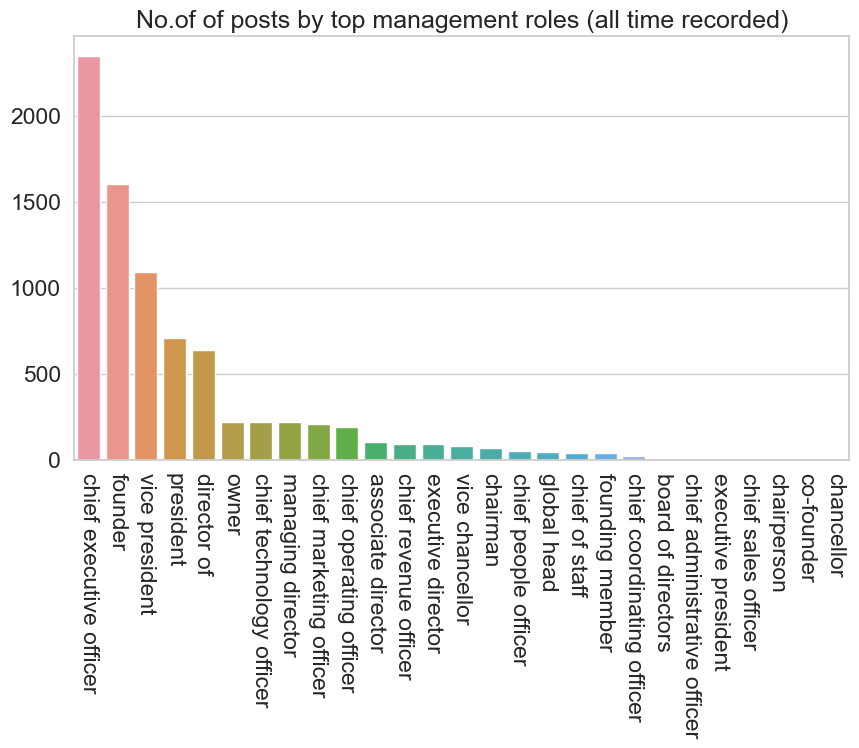

In [715]:
plt.figure(figsize = (10,5.5))
# plt.pie(data, labels=labels, autopct='%1.1f%%', startangle=180, radius=1.5)
# plt.pie(y_vals ,labels = x_vals,startangle=90 , pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.85, textprops={'fontsize': 12})

sns.barplot(x=x_vals, y=y_vals)
plt.title('No.of of posts by top management roles (all time recorded)')
plt.xticks(rotation=270)
plt.show()


In [473]:
# doms = list(tot_domain_freq.keys())
# curr_domname = doms[1]
# fig = plt.figure(figsize=(10,10))

# # colormap1=['firebrick','LightCoral','Salmon','DarkSalmon','mistyrose', "crimson"]
# # colormap1 = sorted_names[140:148]
# print(len(tot_domain_freq[curr_domname]))
# colormap1 = sorted_names[15:15+len(tot_domain_freq[curr_domname])]
# # , colors=colormap1
# plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1 ,labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.85, textprops={'fontsize': 10})
# plt.title("Distribution of posts in " + curr_domname + " domain")
# plt.show()

In [474]:
# doms = list(tot_domain_freq.keys())
# curr_domname = doms[2]
# fig = plt.figure(figsize=(10,10))

# # colormap1=['firebrick','LightCoral','Salmon','DarkSalmon','mistyrose', "crimson"]
# # colormap1 = sorted_names[140:148]
# print(len(tot_domain_freq[curr_domname]))
# colormap1 = sorted_names[66:66+len(tot_domain_freq[curr_domname])]
# # , colors=colormap1
# plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1 ,labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.80, textprops={'fontsize': 10})
# plt.title("Distribution of posts in " + curr_domname + " domain")
# plt.show()

In [475]:
# doms = list(tot_domain_freq.keys())
# curr_domname = doms[3]
# fig = plt.figure(figsize=(10,10))

# # colormap1=['firebrick','LightCoral','Salmon','DarkSalmon','mistyrose', "crimson"]
# # colormap1 = sorted_names[140:148]
# print(len(tot_domain_freq[curr_domname]))
# colormap1 = sorted_names[83:83+len(tot_domain_freq[curr_domname])]
# # , colors=colormap1
# plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1, wedgeprops= {"linewidth" : 0.5},labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.65, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.90, textprops={'fontsize': 10})
# plt.title("Distribution of posts in " + curr_domname + " domain")
# plt.show()

In [476]:
# doms = list(tot_domain_freq.keys())
# curr_domname = doms[4]
# fig = plt.figure(figsize=(10,10))

# # colormap1=['firebrick','LightCoral','Salmon','DarkSalmon','mistyrose', "crimson"]
# # colormap1 = sorted_names[140:148]
# print(len(tot_domain_freq[curr_domname]))
# colormap1 = sorted_names[38:38+len(tot_domain_freq[curr_domname])]
# # , colors=colormap1
# plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1, wedgeprops= {"linewidth" : 2},labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.80, textprops={'fontsize': 10})
# plt.title("Distribution of posts in " + curr_domname + " domain")
# plt.show()

In [477]:
# doms = list(tot_domain_freq.keys())
# curr_domname = doms[5]
# fig = plt.figure(figsize=(10,10))

# # colormap1=['firebrick','LightCoral','Salmon','DarkSalmon','mistyrose', "crimson"]
# # colormap1 = sorted_names[140:148]
# print(len(tot_domain_freq[curr_domname]))
# colormap1 = sorted_names[54:54+len(tot_domain_freq[curr_domname])]
# # , colors=colormap1
# plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1, wedgeprops= {"linewidth" : 2},labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.80, textprops={'fontsize': 10})
# plt.title("Distribution of posts in " + curr_domname + " domain")
# plt.show()

In [478]:
# doms = list(tot_domain_freq.keys())
# curr_domname = doms[6]
# fig = plt.figure(figsize=(10,10))

# # colormap1=['firebrick','LightCoral','Salmon','DarkSalmon','mistyrose', "crimson"]
# # colormap1 = sorted_names[140:148]
# print(len(tot_domain_freq[curr_domname]))
# colormap1 = sorted_names[135:135+len(tot_domain_freq[curr_domname])]
# # , colors=colormap1
# plt.pie(tot_domain_freq[curr_domname].values(), colors = colormap1, wedgeprops= {"linewidth" : 2},labels=tot_domain_freq[curr_domname].keys(),startangle=90, pctdistance=0.75, shadow = True, counterclock=False,  center = (0,0), autopct='%1.1f%%', radius = 0.80, textprops={'fontsize': 10})
# plt.title("Distribution of posts in " + curr_domname + " domain")
# plt.show()

In [479]:
df2_cleaned_txt = df2.copy()
df2_cleaned_txt["text"] = df2_cleaned_txt["text"].apply(remove_hashtags)

In [480]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [481]:
def clean_text_linkedin(text):
    text = clean(text, no_urls = True ,no_emoji=True, no_emails = True, lower = True, no_punct = True, no_currency_symbols=True, no_phone_numbers=True, replace_with_url="", replace_with_currency_symbol="", replace_with_email="", replace_with_phone_number="")
    return text

df2_cleaned_txt["text"] = df2_cleaned_txt["text"].apply(clean_text_linkedin)

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\p'
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\o'
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\_'
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: DeprecationWarning: invalid escape sequence '\ '
  text = text.encode("latin", "backslashreplace").decode("unicode-escape")
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:58: Deprecati

In [482]:
df2_cleaned_txt = remove_stopwords(df2_cleaned_txt, "text")

In [483]:
from langdetect import detect

def remove_non_english_words(texts):
    english_texts = []
    i = 0
    for text in texts:
        try:
            language = detect(text)
            if language == 'en':
                english_texts.append(text)
                eng_indices.append(i)
                
        except:
            pass
        i += 1
    return english_texts

texts = list(df2_cleaned_txt["text"])
english_texts = remove_non_english_words(texts)
print(len(english_texts))

38059


In [636]:
# english_texts

In [484]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess


# text_data = df2_cleaned_txt_eng["text"].values.tolist()
text_data = english_texts

def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

data_words = list(sent_to_words(text_data))

In [485]:
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1][0][:30])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 2), (20, 1), (21, 2), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1)]


In [486]:
from pprint import pprint

# number of topics
num_topics = 25

# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics,decay=0.85,iterations=100, random_state = 666
                                      )
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [487]:
# import pyLDAvis.gensim
import pickle 
import pyLDAvis

# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join(str(num_topics))

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
# if 1 == 1:
#     LDAvis_prepared = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
#     with open(LDAvis_data_filepath, 'wb') as f:
#         pickle.dump(LDAvis_prepared, f)
        
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, str(num_topics) +'.html')

LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
15    -0.013662 -0.010366       1        1  11.381048
18    -0.024683 -0.017430       2        1  10.166103
9     -0.038034 -0.000675       3        1   9.329357
24    -0.011890 -0.001987       4        1   7.281958
14    -0.019886  0.002809       5        1   7.051737
8     -0.013036 -0.005100       6        1   6.064654
0     -0.008987  0.026042       7        1   4.374303
11    -0.016631 -0.020916       8        1   4.290182
1     -0.009770  0.013707       9        1   3.389898
19    -0.019874 -0.000888      10        1   3.116005
21    -0.010041  0.017865      11        1   2.977353
13     0.006177  0.017616      12        1   2.863638
16    -0.012641 -0.020228      13        1   2.746671
10    -0.009822 -0.024794      14        1   2.745496
22     0.001256  0.048503      15        1   2.610720
6      0.031775  0.004262      16        1   2.603775
20     0.007503 -0.004187      17        1   2.427311
17     0.036092 -0.000790      18        1   2.361667
3     -0.011999  0.038275      19        1   2.357625
4      0.019980  0.022293      20        1   2.059613
7     -0.011784 -0.037999      21        1   1.884045
23     0.012031  0.018553      22        1   1.771153
12     0.011840 -0.010356      23        1   1.644586
2      0.083245 -0.008124      24        1   1.441910
5      0.022840 -0.046084      25        1   1.059196, topic_info=        Term          Freq         Total Category  logprob  loglift
173  layoffs  27469.000000  27469.000000  Default  30.0000  30.0000
416      job  14999.000000  14999.000000  Default  29.0000  29.0000
35    layoff   7011.000000   7011.000000  Default  28.0000  28.0000
28    hiring   7158.000000   7158.000000  Default  27.0000  27.0000
104   people  13335.000000  13335.000000  Default  26.0000  26.0000
..       ...           ...           ...      ...      ...      ...
34      know     67.730104   9241.114704  Topic25  -5.8498  -0.3682
544     work     66.270589   9637.316473  Topic25  -5.8716  -0.4320
105   please     57.263247   6505.703008  Topic25  -6.0177  -0.1851
38      like     58.995279   8227.641754  Topic25  -5.9879  -0.3901
416      job     60.526476  14999.458010  Topic25  -5.9623  -0.9650

[2142 rows x 6 columns], token_table=       Topic      Freq  Term
term                        
20654      1  0.192227    aa
20654      2  0.024028    aa
20654      4  0.048057    aa
20654      6  0.072085    aa
20654      7  0.600711    aa
...      ...       ...   ...
15163     13  0.021907  zoho
15163     16  0.175255  zoho
15163     21  0.240976  zoho
15163     22  0.043814  zoho
9150      13  0.738177  zume

[9160 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[16, 19, 10, 25, 15, 9, 1, 12, 2, 20, 22, 14, 17, 11, 23, 7, 21, 18, 4, 5, 8, 24, 13, 3, 6])

In [488]:
emotion_clf = pipeline("text-classification", model="j-hartmann/emotion-english-distilroberta-base", return_all_scores=True)

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/transformers/pipelines/text_classification.py:104: UserWarning: `return_all_scores` is now deprecated,  if want a similar funcionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


In [489]:
for c in emotion_clf("")[0]:
    print(c)

{'label': 'anger', 'score': 0.0641336590051651}
{'label': 'disgust', 'score': 0.10400664806365967}
{'label': 'fear', 'score': 0.05136282369494438}
{'label': 'joy', 'score': 0.040564462542533875}
{'label': 'neutral', 'score': 0.5494766235351562}
{'label': 'sadness', 'score': 0.11169018596410751}
{'label': 'surprise', 'score': 0.07876559346914291}


In [490]:
def get_emotions(df):
    
    emotions_arr = []
    
    for i in range(len(df)):
#         print(len(df.iloc[i]["text"]), i)
        
        try:
            classes = emotion_clf(df.iloc[i]["text"])[0]
            temp_arr = []
            for cls_dic in classes:
    #             print(cls_dic)
                temp_arr.append(cls_dic["score"])
    #         print()
            emotions_arr.append(temp_arr)
            
        except:
            emotions_arr.append([None]*7)


    return emotions_arr

In [491]:
# https://www.kaggle.com/code/colearninglounge/nlp-data-preprocessing-and-cleaning

def remove_hashtags(data):
    clean_data = re.sub(r"#[A-Za-z0-9_]+", "", data)
    clean_data = re.sub(r"\$[A-Za-z0-9_]+", "", clean_data)
    return clean_data

def remove_hashsymbol(data):
    clean_data = re.sub(r"#", "", data)
    return clean_data

def remove_punctuations(data):
    punct_tag=re.compile(r'[^\w\s]')
    data=punct_tag.sub(r'',data)
    return data

def remove_comma(data):
    punct_tag=re.compile(r'[^\w\s]')
    data=punct_tag.sub(r' ',data)
    return data

def remove_html(data):
    data = re.sub(r"https?://[^\s]+", "", data)
    
    return data

def remove_url(data):
    url_clean= re.compile(r"https://\S+|www\.\S+")
    data=url_clean.sub(r'',data)
    return data

def remove_html(data):
    data = re.sub(r"https?://[^\s]+", "", data)
    
    return data

def remove_url(data):
    url_clean= re.compile(r"https://\S+|www\.\S+")
    data=url_clean.sub(r'',data)
    return data

def remove_stopwords(df, column):
    stop_words = set(stopwords.words("english"))
    stop_words.add("see")
    
    def remove_stopwords_from_text(text):
        word_tokens = word_tokenize(text)
        filtered_tokens = [token for token in word_tokens if not token.lower() in stop_words]
        return " ".join(filtered_tokens)
    
    df[column] = df[column].apply(remove_stopwords_from_text)
    return df

def clean_text_linkedIn(text):
    text = clean(text ,no_urls = True ,no_emoji=True, no_emails = True, lower = False, no_punct = False, no_currency_symbols=True, no_phone_numbers=True, replace_with_url="", replace_with_currency_symbol="", replace_with_email="", replace_with_phone_number="")
    return text

def convert_lowercase(text):
    return clean(text, lower = True)

# df2_cleaned_txt["text"] = df2_cleaned_txt["text"].apply(remove_hashtags)
# df2_cleaned_txt["text"] = df2_cleaned_txt["text"].apply(clean_text_linkedin)
# df2_cleaned_txt = remove_stopwords(df2_cleaned_txt, "text")

In [679]:
df2_sent = df2.copy()

df2_sent["text"] = df2_sent["text"].apply(remove_hashtags)
df2_sent["text"] = df2_sent["text"].apply(remove_comma)
df2_sent["text"] = df2_sent["text"].apply(remove_html)
df2_sent["text"] = df2_sent["text"].apply(remove_punctuations)
df2_sent["text"] = df2_sent["text"].apply(clean_text_linkedIn)
df2_sent["text"] = df2_sent["text"].apply(convert_lowercase)

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = demojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = emojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = demojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = emojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = demojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = emojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = emojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = demojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = emojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = emojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = demojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the 

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = demojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = emojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = emojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = emojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = demojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the 

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = emojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:77: DeprecationWarning: The parameter 'use_aliases' in emoji.demojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  text = demojize(text, use_aliases=True)
/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/cleantext/clean.py:91: DeprecationWarning: The parameter 'use_aliases' in emoji.emojize() is deprecated and will be removed in version 2.0.0. Use language='alias' instead.
To hide this warning, pin/downgrade the 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [680]:
s = time.time()
emotions_arr = get_emotions(df2_sent)
e = time.time()
print((e-s)/60, " mins")

22.227725315093995  mins


In [681]:
df2_emotions = df2_sent.copy()

In [682]:
sent_df_obtained = pd.DataFrame(emotions_arr, columns=['anger', 'disgust', 'fear', 'joy', 'neutral', 'sadness', 'surprise'])

In [683]:
# df2

In [684]:
df2_emotions = pd.concat([df2_emotions, sent_df_obtained], axis=1)

In [685]:
# df2_emotions
df2_sent.shape, df2_emotions.shape

((40371, 7), (40371, 14))

In [686]:
df2_emotions.to_csv("emotions_1_linkedin.csv")

In [687]:
texttt = '''If you were part of the recent layoffs at World Wide Technology  or Balto  I’d love to speak to you. We’re hiring tech, creative, analytics, sales, you name it. Coming up on 12 years with zero layoffs at Drive Social Media'''
emotion_clf(texttt)


[[{'label': 'anger', 'score': 0.004614997189491987},
  {'label': 'disgust', 'score': 0.0021208790130913258},
  {'label': 'fear', 'score': 0.01973017491400242},
  {'label': 'joy', 'score': 0.3605000972747803},
  {'label': 'neutral', 'score': 0.3202735185623169},
  {'label': 'sadness', 'score': 0.20393140614032745},
  {'label': 'surprise', 'score': 0.08882889896631241}]]

In [688]:
df2_emotions.columns

Index(['Unnamed: 0', 'text', 'job', 'date', 'num_reacts', 'num_cmts',
       'num_rpsts', 'anger', 'disgust', 'fear', 'joy', 'neutral', 'sadness',
       'surprise'],
      dtype='object')

In [689]:
# df2_emotions[df2_emotions["anger"] > 0.75]

In [690]:
df2_emotions['Most Probable Class'] = sent_df_obtained.idxmax(axis=1)

In [691]:
df2_emotions.columns

Index(['Unnamed: 0', 'text', 'job', 'date', 'num_reacts', 'num_cmts',
       'num_rpsts', 'anger', 'disgust', 'fear', 'joy', 'neutral', 'sadness',
       'surprise', 'Most Probable Class'],
      dtype='object')

In [692]:
print("The no.of posts which had unlabelled emotions :- ", df2_emotions[df2_emotions["Most Probable Class"].isna()].shape[0])

print("Percentage of posts which were unlabelled :- {}% ".format(df2_emotions[df2_emotions["Most Probable Class"].isna()].shape[0]*100/df2_emotions.shape[0]))


The no.of posts which had unlabelled emotions :-  994
Percentage of posts which were unlabelled :- 2.4621634341482745% 


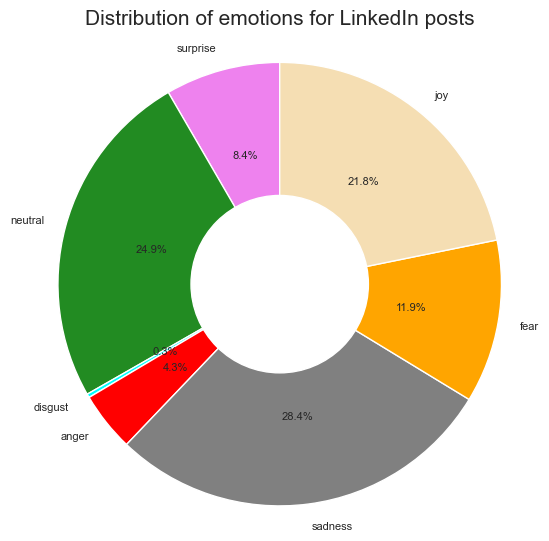

In [695]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'df' is your dataframe and 'column' is the column with class names
class_counts = df2_emotions['Most Probable Class'].value_counts()

def cyclic_left_shift(array, shift_length):
    return array[shift_length:] + array[:shift_length]

re_ordered_cls = ['anger','sadness', 'fear','joy' ,'surprise', 'neutral','disgust']
re_ordered_cls = cyclic_left_shift(re_ordered_cls, 4)
class_counts = class_counts.reindex(re_ordered_cls)


# Setting up the plot
fig, ax = plt.subplots()
ax.axis('equal')
# Plotting the donut plot
# plt.figure(figsize=(10,10))
outer_circle = plt.Circle((0,0), 1.2, color='gray', fill=False)
ax.add_artist(outer_circle)

colors = ['violet','forestgreen','cyan', 'red', 'grey', 'orange', 'wheat']
explode = [0.00 for i in range(len(class_counts))]

ax.pie(class_counts, radius=1.5,explode=explode, labels=class_counts.index, 
       autopct='%1.1f%%', startangle=90,  textprops={'fontsize': 8}, colors = colors)

# Adding a center circle to make it a donut plot
inner_circle = plt.Circle((0,0), 0.6, color='white')
ax.add_artist(inner_circle)

plt.title('Distribution of emotions for LinkedIn posts', fontsize=15, y= 1.18)
plt.show()

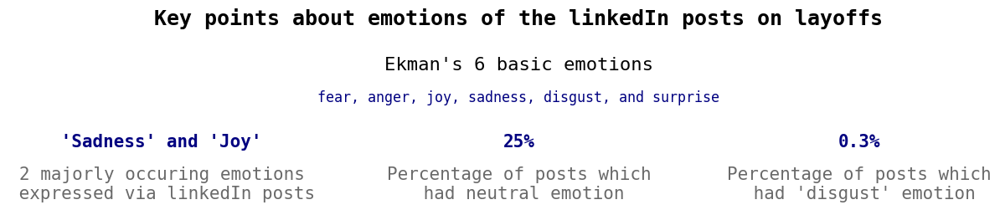

In [696]:
fig=plt.figure(figsize=(5,2),facecolor='white')

ax0=fig.add_subplot(1,1,1)
ax0.text(1.1,0.75,"fear, anger, joy, sadness, disgust, and surprise",color='navy',fontsize=12, fontweight='light', fontfamily='monospace',ha='center')
ax0.text(1.1,1,"Ekman's 6 basic emotions",color='black',fontsize=16, fontweight='light', fontfamily='monospace',ha='center')
ax0.text(1.1,1.35,"Key points about emotions of the linkedIn posts on layoffs",color='black',fontsize=18, fontweight='bold', fontfamily='monospace',ha='center')

ax0.text(0,0.4,''' 'Sadness' and 'Joy' ''',color='navy',fontsize=15, fontweight='bold', fontfamily='monospace',ha='center')
ax0.text(0,0.001,"2 majorly occuring emotions\n expressed via linkedIn posts",color='dimgrey',fontsize=15, fontweight='light', fontfamily='monospace',ha='center')

# ax0.text(0.75,0.4,"6",color='gold',fontsize=15, fontweight='bold', fontfamily='monospace',ha='center')
# ax0.text(0.75,0.001,"Number of features \nin the dataset",color='dimgrey',fontsize=15, fontweight='light', fontfamily='monospace',ha='center')

ax0.text(1.1,0.4,"25%",color='navy',fontsize=15, fontweight='bold', fontfamily='monospace',ha='center')
ax0.text(1.1,0.001,"Percentage of posts which\n had neutral emotion",color='dimgrey',fontsize=15, fontweight='light', fontfamily='monospace',ha='center')

ax0.text(2.15,0.4,"0.3%",color='navy',fontsize=15, fontweight='bold', fontfamily='monospace',ha='center')
ax0.text(2.15,0.001,"Percentage of posts which\n had 'disgust' emotion",color='dimgrey',fontsize=15, fontweight='light', fontfamily='monospace',ha='center')


ax0.set_yticklabels('')
ax0.tick_params(axis='y',length=0)
ax0.tick_params(axis='x',length=0)
ax0.set_xticklabels('')
plt.grid(False)

for direction in ['top','right','left','bottom']:
    ax0.spines[direction].set_visible(False)


In [616]:
# import gensim
# import gensim.corpora as corpora
# from gensim.utils import simple_preprocess
# import gensim.corpora as corpora
# import pickle 
# import pyLDAvis
# from pprint import pprint


# class LDA_visualise:
    
#     def __init__(self,text_data,num_topics):
        
#         self.text_data = text_data
#         self.num_topics = num_topics
#         self.doc_lda = None
#         self.lda_model = None
#         self.num_words = 0
#         self.corpus = None
#         self.id2word = None
#         self.__get_corpus_ids()

#     def __sent_to_words(self ,sentences):
#         for sentence in sentences:
#             yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

#     def __get_corpus_ids(self):
#     # text_data = ""

#         data_words = list(self.__sent_to_words(self.text_data))

#         self.id2word = corpora.Dictionary(data_words)
#         self.texts = data_words
#         self.corpus = [id2word.doc2bow(text) for text in texts]



#     def build_lda_model(self, num_iter = 100, random_state = 666, decay = 0.85):

#         self.lda_model = gensim.models.LdaMulticore(corpus= self.corpus,
#                                                id2word= self.id2word,
#                                                num_topics= self.num_topics,decay = decay,iterations=num_iter, random_state = random_state
#                                               )
#         self.doc_lda = self.lda_model[corpus]

#     def visualize_topics(self,file_name):
                
#     # Visualize the topics

#         file_name = file_name + "_"+ str(self.num_words)
#         pyLDAvis.enable_notebook()
#         LDAvis_data_filepath = os.path.join(file_name)

#         if 1 == 1:
#             LDAvis_prepared = pyLDAvis.gensim_models.prepare(self.lda_model, self.corpus, self.id2word)
#             with open(LDAvis_data_filepath, 'wb') as f:
#                 pickle.dump(LDAvis_prepared, f)

#         with open(LDAvis_data_filepath, 'rb') as f:
#             LDAvis_prepared = pickle.load(f)
#         pyLDAvis.save_html(LDAvis_prepared, file_name +'.html')

#         LDAvis_prepared

In [621]:
# ldavis = LDA_visualise(text_data=english_texts, num_topics=15)


In [622]:
# ldavis.build_lda_model()

In [698]:
anger_df = df2_emotions[df2_emotions["Most Probable Class"] == "joy"].sort_values(by = "num_reacts", ascending = False)

In [699]:
anger_df.reset_index(inplace=True)

In [700]:
anger_df_cleaned["text"] = anger_df["text"].apply(remove_html)
anger_df_cleaned["text"] = anger_df_cleaned["text"].apply(remove_url)

anger_df_cleaned = remove_stopwords(anger_df_cleaned, "text")

In [701]:
# # https://www.kaggle.com/code/colearninglounge/nlp-data-preprocessing-and-cleaning

# def remove_hashtags(data):
#     clean_data = re.sub(r"#[A-Za-z0-9_]+", "", data)
#     clean_data = re.sub(r"\$[A-Za-z0-9_]+", "", clean_data)
#     return clean_data

# def remove_hashsymbol(data):
#     clean_data = re.sub(r"#", "", data)
#     return clean_data

# def remove_punctuations(data):
#     punct_tag=re.compile(r'[^\w\s]')
#     data=punct_tag.sub(r'',data)
#     return data

# def remove_comma(data):
#     punct_tag=re.compile(r'[^\w\s]')
#     data=punct_tag.sub(r' ',data)
#     return data

# def remove_html(data):
#     data = re.sub(r"https?://[^\s]+", "", data)
    
#     return data

# def remove_url(data):
#     url_clean= re.compile(r"https://\S+|www\.\S+")
#     data=url_clean.sub(r'',data)
#     return data

# def remove_html(data):
#     data = re.sub(r"https?://[^\s]+", "", data)
    
#     return data

# def remove_url(data):
#     url_clean= re.compile(r"https://\S+|www\.\S+")
#     data=url_clean.sub(r'',data)
#     return data

# def remove_stopwords(df, column):
#     stop_words = set(stopwords.words("english"))
#     stop_words.add("see")
    
#     def remove_stopwords_from_text(text):
#         word_tokens = word_tokenize(text)
#         filtered_tokens = [token for token in word_tokens if not token.lower() in stop_words]
#         return " ".join(filtered_tokens)
# #     
#     df[column] = df[column].apply(remove_stopwords_from_text)
#     return df

# def clean_text_linkedIn(text):
#     text = clean(text ,no_urls = True ,no_emoji=True, no_emails = True, lower = False, no_punct = False, no_currency_symbols=True, no_phone_numbers=True, replace_with_url="", replace_with_currency_symbol="", replace_with_email="", replace_with_phone_number="")
#     return text

# def convert_lowercase(text):
#     return clean(text, lower = True)

# # df2_cleaned_txt["text"] = df2_cleaned_txt["text"].apply(remove_hashtags)
# # df2_cleaned_txt["text"] = df2_cleaned_txt["text"].apply(clean_text_linkedin)
# # df2_cleaned_txt = remove_stopwords(df2_cleaned_txt, "text")

In [705]:
anger_df_cleaned.iloc[0]["text"]

'tata hiring world firing meta twitter others carry biggest layoffs tata announces hire 800 tech workers tata offering specifically professionals lost work recently lay offs companiesthis first time tata rescued people recently tata also rescued air india company thousands risk losing jobs airline shut whether mumbai attack 2008 port tailbot steel factory 2016 orair india acquisition tata always step forward support people give reason smile salute ratan tata sir reshare post world knows power tata credit abhishek praveen'

In [706]:
anger_texts = []
for i in range(len(anger_df_cleaned)):
    anger_texts.append(anger_df_cleaned.iloc[i]["text"])

In [707]:
len(anger_texts)

8586

In [709]:
# import gensim
# import gensim.corpora as corpora
# from gensim.utils import simple_preprocess
# import gensim.corpora as corpora
# from pprint import pprint
# import pickle 
# import pyLDAvis
# import pyLDAvis.gensim_models

# def sent_to_words(sentences):
#     for sentence in sentences:
#         yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

# data_words_a = list(sent_to_words(anger_texts))

# # Create Dictionary
# id2word_a = corpora.Dictionary(data_words_a)
# # Create Corpus
# texts_a = data_words_a
# # Term Document Frequency
# corpus_a = [id2word_a.doc2bow(text) for text in texts_a]


# # number of topics
# num_topics_a = 15

# lda_model_a = gensim.models.LdaMulticore(corpus=corpus_a,
#                                        id2word=id2word_a,
#                                        num_topics=num_topics_a ,decay=0.85,iterations=100, random_state = 666
#                                       )
# doc_lda_a = lda_model_a[corpus_a]

# pyLDAvis.enable_notebook()
# LDAvis_data_filepath_a = os.path.join("anger_posts")


# if 1 == 1:
#     LDAvis_prepared_a = pyLDAvis.gensim_models.prepare(lda_model_a, corpus_a, id2word_a)
#     with open(LDAvis_data_filepath_a, 'wb') as f:
#         pickle.dump(LDAvis_prepared_a, f)
        
# # load the pre-prepared pyLDAvis data from disk
# with open(LDAvis_data_filepath_a, 'rb') as f:
#     LDAvis_prepared_a = pickle.load(f)
# pyLDAvis.save_html(LDAvis_prepared_a, "anger_posts" +'.html')

# LDAvis_prepared_a

In [510]:
joy_df = df2_emotions[df2_emotions["Most Probable Class"] == "joy"]

In [511]:
joy_df.iloc[0]["text"]

'well my feed is layoff after layoff my heart would always hurt for all the people that were laid off oddly enough when i and 40 others from spur reply got laid off yesterday i felt optimistic and okay i have hope and confidence in this new step in my life and career thank you spur reply and all of my colleagues there s too many to list and tag i you all for helping me grow into who i am i started at spur as a college intern almost 3 years ago and never left i am i bring years of experience in consulting for microsoft s ai marketing team and a fresh 10 months of experience in talent acquisition i m driven organized adaptable and willing to learn anything please feel free to like share repost etc all and any help is very appreciated'

In [512]:
from transformers import BertTokenizer, TFBertForSequenceClassification
from transformers import InputExample, InputFeatures

In [513]:
NER = spacy.load("en_core_web_sm")

In [514]:
raw_text="The Indian Space Research Organisation or is the national space agency of India, headquartered in Bengaluru. It operates under Department of Space which is directly overseen by the Prime Minister of India while Chairman of ISRO acts as executive of DOS as well."
text1= NER(raw_text)
for word in text1.ents:
    print(word.text,word.label_)
displacy.render(text1,style="ent",jupyter=True)

The Indian Space Research Organisation ORG
India GPE
Bengaluru GPE
Department of Space ORG
India GPE
ISRO ORG
DOS ORG


/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/spacy/displacy/__init__.py:71: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [515]:
for word in text1.ents:
    print(word.text,word.label_)

The Indian Space Research Organisation ORG
India GPE
Bengaluru GPE
Department of Space ORG
India GPE
ISRO ORG
DOS ORG


In [516]:
displacy.render(text1,style="ent",jupyter=True)

/Users/sreevaatsav/.pyenv/versions/project_env/lib/python3.10/site-packages/spacy/displacy/__init__.py:71: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [517]:
from transformers import AutoTokenizer, AutoModelForTokenClassification
from transformers import pipeline

tokenizer = AutoTokenizer.from_pretrained("dslim/bert-base-NER")
model = AutoModelForTokenClassification.from_pretrained("dslim/bert-base-NER")

nlp = pipeline("ner", model=model, tokenizer=tokenizer)
example = "My name is Wolfgang and I live in Berlin"

ner_results = nlp(example)
print(ner_results)

[{'entity': 'B-PER', 'score': 0.9990139, 'index': 4, 'word': 'Wolfgang', 'start': 11, 'end': 19}, {'entity': 'B-LOC', 'score': 0.999645, 'index': 9, 'word': 'Berlin', 'start': 34, 'end': 40}]
